In [14]:
import pandas as pd
import numpy as np
import json
import uuid
import geopandas
import matplotlib.pyplot as plt
from geojson import Feature, FeatureCollection, Point, MultiLineString
from mpl_toolkits.basemap import Basemap
from scipy import stats

In [15]:
def get_gis():
    with open('gis_creds.json', 'r') as f:
        gis_cred = json.load(f)
    gis = GIS(gis_cred['login'], gis_cred['username'], gis_cred['password'])
    return gis

In [16]:
with open('seattle_routes.json') as j_file:
    json_data = json.load(j_file)

In [176]:
# with open('gis_creds.json', 'w') as f:
#     json.dump(creds, f)

In [17]:
len(json_data)

4310

In [18]:
row_aggregator = []

for pair in json_data:
    for i in range(len(pair['step_list'])):
        row_dict = {}
        row_dict['start_address'] = pair['start_address']
        row_dict['end_address'] = pair['end_address']
        row_dict['start_coords'] = pair['start_coords']
        row_dict['end_coords'] = pair['end_coords']
        row_dict['total_distance'] = pair['total_distance']
        row_dict['unit_distance'] = pair['unit_distance']
        row_dict['step'] = i+1
        row_dict['step_coords'] = pair['step_list'][i]
        row_aggregator.append(row_dict)

In [19]:
flat_df = pd.DataFrame(row_aggregator)

In [20]:
flat_df['start_lat'] = flat_df['start_coords'].apply(lambda x: x[0])
flat_df['end_lat'] = flat_df['end_coords'].apply(lambda x: x[0])
flat_df['start_lon'] = flat_df['start_coords'].apply(lambda x: x[1])
flat_df['end_lon'] = flat_df['end_coords'].apply(lambda x: x[1])
flat_df['step_lat'] = flat_df['step_coords'].apply(lambda x: x[0])
flat_df['step_lon'] = flat_df['step_coords'].apply(lambda x: x[1])

In [21]:
flat_df.head()

,start_address,end_address,start_coords,end_coords,total_distance,unit_distance,step,step_coords,start_lat,end_lat,start_lon,end_lon,step_lat,step_lon
0,"1900 5th Ave, Seattle, WA 98101, USA","601 N 34th St, Seattle, WA 98103, USA","[47.614221, -122.3380349]","[47.6489043, -122.3504975]",3.3,mi,1,"[47.614221, -122.3380349]",47.614221,47.648904,-122.338035,-122.350498,47.614221,-122.338035
1,"1900 5th Ave, Seattle, WA 98101, USA","601 N 34th St, Seattle, WA 98103, USA","[47.614221, -122.3380349]","[47.6489043, -122.3504975]",3.3,mi,2,"[47.6174767, -122.3435548]",47.614221,47.648904,-122.338035,-122.350498,47.617477,-122.343555
2,"1900 5th Ave, Seattle, WA 98101, USA","601 N 34th St, Seattle, WA 98103, USA","[47.614221, -122.3380349]","[47.6489043, -122.3504975]",3.3,mi,3,"[47.6185586, -122.343616]",47.614221,47.648904,-122.338035,-122.350498,47.618559,-122.343616
3,"1900 5th Ave, Seattle, WA 98101, USA","601 N 34th St, Seattle, WA 98103, USA","[47.614221, -122.3380349]","[47.6489043, -122.3504975]",3.3,mi,4,"[47.6220647, -122.3436064]",47.614221,47.648904,-122.338035,-122.350498,47.622065,-122.343606
4,"1900 5th Ave, Seattle, WA 98101, USA","601 N 34th St, Seattle, WA 98103, USA","[47.614221, -122.3380349]","[47.6489043, -122.3504975]",3.3,mi,5,"[47.6246644, -122.343588]",47.614221,47.648904,-122.338035,-122.350498,47.624664,-122.343588


In [ ]:
import re

In [22]:
def parse_street_address_arr(addy_arr, lat_arr, lon_arr):
    output_list = []
    for i in range(len(addy_arr)):
        addy_dict = {}
        addy_comps = addy_arr[i].split(',')
        #     print(addy_comps)

        if len(addy_comps) < 4:
            street_num = ''
            city = addy_comps[-3]
            state = addy_comps[-2].split(' ')[0]
            zip_code = addy_comps[-2].split(' ')[1]
            country = addy_comps[-1]

        else:
            street_num = addy_comps[-4]
            city = addy_comps[-3]
            state = addy_comps[-2].split(' ')[0]
            zip_code = addy_comps[-2].split(' ')[1]
            country = addy_comps[-1]
        
        addy_dict['end_address'] = addy_arr[i]
        addy_dict['number'] = street_num
        addy_dict['city'] = city
        addy_dict['state'] = state
        addy_dict['zip'] = zip_code
        addy_dict['country'] = country
        addy_dict['step_lat'] = lat_arr[i]
        addy_dict['step_lon'] = lon_arr[i]
        output_list.append(addy_dict)
        
    out_df = pd.DataFrame(output_list)
    return out_df
    
#     return addy, street_num, city, state, zip_code, country

#     return ('', '', '', '', '')

#     print(street_num, city, state, zip_code, country)
    
#     zip_pattern = re.compile(r'(\d{5})')
#     zip_match = zip_pattern.search(state_zip)

In [23]:
def parse_street_address(addy_string):
#     output_list = []
#     for i in range(len(addy_arr)):
#         addy_dict = {}
    addy_comps = addy_string.split(',')
#     print(addy_comps)

    if len(addy_comps) < 4:
        street_num = ''
        city = addy_comps[-3]
        state = addy_comps[-2].split(' ')[0]
        zip_code = addy_comps[-2].split(' ')[1]
        country = addy_comps[-1]

    else:
        street_num = addy_comps[-4]
        city = addy_comps[-3]
        state = addy_comps[-2].split(' ')[0]
        zip_code = addy_comps[-2].split(' ')[1]
        country = addy_comps[-1]
        
#         addy_dict['end_address'] = addy_arr[i]
#         addy_dict['number'] = street_num
#         addy_dict['city'] = city
#         addy_dict['state'] = state
#         addy_dict['zip'] = zip_code
#         addy_dict['country'] = country
    
    return (street_num, city, state, zip_code, country)

In [24]:
def parse_zip(addy_string):
    zip_code = None
    addy_comps = addy_string.split(',')
    addy_comps = [elem.strip() for elem in addy_comps]
#     print(addy_comps)
    
    state_zip = addy_comps[-2].split(' ')
    if len(state_zip) == 2:
        zip_code = int(state_zip[1])
    return zip_code

In [26]:
flat_df_copy = flat_df.copy()

In [294]:
np.mean(flat_df_copy['zip'])

98157.85216514223

In [27]:
flat_df_copy['zip'] = flat_df_copy.end_address.apply(lambda x: parse_zip(x))
# flat_df_copy['zip'].fillna(flat_df_copy)

flat_df_copy['zip'].fillna(flat_df_copy['zip'].median(), inplace=True)
# flat_df_copy['zip'].fillna(stats.mode(flat_df_copy['zip']), inplace=True)

In [261]:
# df_to_merge = parse_street_address(flat_df_copy.end_address.values, flat_df_copy.step_lat.values, flat_df_copy.step_lon.values)

In [300]:
# new_cols = ['number', 'city', 'state', 'zip', 'country']
# flat_df_copy[new_cols] = flat_df_copy.end_address.apply(parse_street_address)
# flat_df_copy['number'], flat_df_copy['city'], flat_df_copy['state'], flat_df_copy['zip'], flat_df_copy['country'] = list(map(parse_street_address, flat_df_copy['end_address']))
# flat_df_copy['number'], flat_df_copy['city'], flat_df_copy['state'], flat_df_copy['zip'], flat_df_copy['country'] = zip(*flat_df_copy.apply(parse_street_address, axis=1))

In [28]:
np.median(flat_df_copy['zip'])

98121.0

In [29]:
flat_df_copy.head()

,start_address,end_address,start_coords,end_coords,total_distance,unit_distance,step,step_coords,start_lat,end_lat,start_lon,end_lon,step_lat,step_lon,zip
0,"1900 5th Ave, Seattle, WA 98101, USA","601 N 34th St, Seattle, WA 98103, USA","[47.614221, -122.3380349]","[47.6489043, -122.3504975]",3.3,mi,1,"[47.614221, -122.3380349]",47.614221,47.648904,-122.338035,-122.350498,47.614221,-122.338035,98103.0
1,"1900 5th Ave, Seattle, WA 98101, USA","601 N 34th St, Seattle, WA 98103, USA","[47.614221, -122.3380349]","[47.6489043, -122.3504975]",3.3,mi,2,"[47.6174767, -122.3435548]",47.614221,47.648904,-122.338035,-122.350498,47.617477,-122.343555,98103.0
2,"1900 5th Ave, Seattle, WA 98101, USA","601 N 34th St, Seattle, WA 98103, USA","[47.614221, -122.3380349]","[47.6489043, -122.3504975]",3.3,mi,3,"[47.6185586, -122.343616]",47.614221,47.648904,-122.338035,-122.350498,47.618559,-122.343616,98103.0
3,"1900 5th Ave, Seattle, WA 98101, USA","601 N 34th St, Seattle, WA 98103, USA","[47.614221, -122.3380349]","[47.6489043, -122.3504975]",3.3,mi,4,"[47.6220647, -122.3436064]",47.614221,47.648904,-122.338035,-122.350498,47.622065,-122.343606,98103.0
4,"1900 5th Ave, Seattle, WA 98101, USA","601 N 34th St, Seattle, WA 98103, USA","[47.614221, -122.3380349]","[47.6489043, -122.3504975]",3.3,mi,5,"[47.6246644, -122.343588]",47.614221,47.648904,-122.338035,-122.350498,47.624664,-122.343588,98103.0


In [310]:
# flat_df_copy.drop_duplicates(inplace=True)

In [311]:
flat_df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44197 entries, 0 to 44196
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   start_address   44197 non-null  object 
 1   end_address     44197 non-null  object 
 2   start_coords    44197 non-null  object 
 3   end_coords      44197 non-null  object 
 4   total_distance  44197 non-null  float64
 5   unit_distance   44197 non-null  object 
 6   step            44197 non-null  int64  
 7   step_coords     44197 non-null  object 
 8   start_lat       44197 non-null  float64
 9   end_lat         44197 non-null  float64
 10  start_lon       44197 non-null  float64
 11  end_lon         44197 non-null  float64
 12  step_lat        44197 non-null  float64
 13  step_lon        44197 non-null  float64
 14  zip             44197 non-null  float64
dtypes: float64(8), int64(1), object(6)
memory usage: 5.1+ MB


In [4]:
in_df = pd.read_csv('seattle_route_coords.csv')

In [30]:
def get_md5_hash_id(row):
    start_end = row['start_address'] + " " + row['end_address']
    hash_id = uuid.uuid3(uuid.NAMESPACE_X500, start_end)
    return hash_id

In [31]:
flat_df_copy['route_id'] = flat_df_copy.apply(get_md5_hash_id, axis=1)

In [32]:
flat_df_copy.to_csv('seattle_route_coords.csv')

In [11]:
in_df.head()

,start_address,end_address,start_coords,end_coords,total_distance,unit_distance,step,step_coords,start_lat,end_lat,start_lon,end_lon,step_lat,step_lon,zip,weight,route_id
0,"1900 5th Ave, Seattle, WA 98101, USA","1900 5th Ave, Seattle, WA 98101, USA","[47.614221, -122.3380349]","[47.6489043, -122.3504975]",3.3,mi,1,"[47.614221, -122.3380349]",47.614221,47.648904,-122.338035,-122.350498,47.614221,-122.338035,98101,1,c50a3a10-a72f-393f-92e1-f331bad59515
1,"1900 5th Ave, Seattle, WA 98101, USA","1900 5th Ave, Seattle, WA 98101, USA","[47.614221, -122.3380349]","[47.6489043, -122.3504975]",3.3,mi,2,"[47.6174767, -122.3435548]",47.614221,47.648904,-122.338035,-122.350498,47.617477,-122.343555,98101,1,c50a3a10-a72f-393f-92e1-f331bad59515
2,"1900 5th Ave, Seattle, WA 98101, USA","1900 5th Ave, Seattle, WA 98101, USA","[47.614221, -122.3380349]","[47.6489043, -122.3504975]",3.3,mi,3,"[47.6185586, -122.343616]",47.614221,47.648904,-122.338035,-122.350498,47.618559,-122.343616,98101,1,c50a3a10-a72f-393f-92e1-f331bad59515
3,"1900 5th Ave, Seattle, WA 98101, USA","1900 5th Ave, Seattle, WA 98101, USA","[47.614221, -122.3380349]","[47.6489043, -122.3504975]",3.3,mi,4,"[47.6220647, -122.3436064]",47.614221,47.648904,-122.338035,-122.350498,47.622065,-122.343606,98101,1,c50a3a10-a72f-393f-92e1-f331bad59515
4,"1900 5th Ave, Seattle, WA 98101, USA","1900 5th Ave, Seattle, WA 98101, USA","[47.614221, -122.3380349]","[47.6489043, -122.3504975]",3.3,mi,5,"[47.6246644, -122.343588]",47.614221,47.648904,-122.338035,-122.350498,47.624664,-122.343588,98101,1,c50a3a10-a72f-393f-92e1-f331bad59515


In [13]:
in_df.to_csv('seattle_route_coords.csv', index=False)

In [321]:
agg_df = flat_df_copy.groupby(by=['end_address', 'end_lat', 'end_lon', 'zip']).agg({'step': 'size'})

In [322]:
agg_df.reset_index(inplace=True)
agg_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4052 entries, 0 to 4051
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   end_address  4052 non-null   object 
 1   end_lat      4052 non-null   float64
 2   end_lon      4052 non-null   float64
 3   zip          4052 non-null   float64
 4   step         4052 non-null   int64  
dtypes: float64(3), int64(1), object(1)
memory usage: 158.4+ KB


In [323]:
agg_df.to_csv('seattle_route_agg.csv', index=False)

In [181]:
flat_df.head()

,start_address,end_address,start_coords,end_coords,total_distance,unit_distance,step,step_coords,start_lat,end_lat,start_lon,end_lon,step_lat,step_lon
0,"1900 5th Ave, Seattle, WA 98101, USA","1900 5th Ave, Seattle, WA 98101, USA","[47.614221, -122.3380349]","[47.6489043, -122.3504975]",3.3,mi,1,"[47.614221, -122.3380349]",47.614221,47.648904,-122.338035,-122.350498,47.614221,-122.338035
1,"1900 5th Ave, Seattle, WA 98101, USA","1900 5th Ave, Seattle, WA 98101, USA","[47.614221, -122.3380349]","[47.6489043, -122.3504975]",3.3,mi,2,"[47.6174767, -122.3435548]",47.614221,47.648904,-122.338035,-122.350498,47.617477,-122.343555
2,"1900 5th Ave, Seattle, WA 98101, USA","1900 5th Ave, Seattle, WA 98101, USA","[47.614221, -122.3380349]","[47.6489043, -122.3504975]",3.3,mi,3,"[47.6185586, -122.343616]",47.614221,47.648904,-122.338035,-122.350498,47.618559,-122.343616
3,"1900 5th Ave, Seattle, WA 98101, USA","1900 5th Ave, Seattle, WA 98101, USA","[47.614221, -122.3380349]","[47.6489043, -122.3504975]",3.3,mi,4,"[47.6220647, -122.3436064]",47.614221,47.648904,-122.338035,-122.350498,47.622065,-122.343606
4,"1900 5th Ave, Seattle, WA 98101, USA","1900 5th Ave, Seattle, WA 98101, USA","[47.614221, -122.3380349]","[47.6489043, -122.3504975]",3.3,mi,5,"[47.6246644, -122.343588]",47.614221,47.648904,-122.338035,-122.350498,47.624664,-122.343588


In [8]:
df = pd.DataFrame(json_data)

In [9]:
df.head()

,start_address,end_address,start_coords,end_coords,total_distance,unit_distance,step_list
0,"1900 5th Ave, Seattle, WA 98101, USA","601 N 34th St, Seattle, WA 98103, USA","[47.614221, -122.3380349]","[47.6489043, -122.3504975]",3.3,mi,"[[47.614221, -122.3380349], [47.6174767, -122...."
1,"808 Howell St, Seattle, WA 98101, USA","Boren Ave N, Seattle, WA 98109, USA","[47.6152935, -122.3339057]","[47.622129, -122.3358333]",0.7,mi,"[[47.6152935, -122.3339057], [47.6148485999999..."
2,"808 Howell St, Seattle, WA 98101, USA","Seattle, WA, USA","[47.6146241, -122.3348153]","[47.6063821, -122.3322283]",0.8,mi,"[[47.6146241, -122.3348153], [47.6149417, -122..."
3,"808 Howell St, Seattle, WA 98101, USA","500 9th Ave N, Seattle, WA 98109, USA","[47.6146241, -122.3348153]","[47.6237794, -122.3397585]",0.8,mi,"[[47.6146241, -122.3348153], [47.6180248999999..."
4,"1101 Dexter Ave N, Seattle, WA 98109, USA","14408 NE 20th St, Bellevue, WA 98007, USA","[47.6288578, -122.3423083]","[47.6292795, -122.1476037]",11.0,mi,"[[47.6288578, -122.3423083], [47.6245434999999..."


In [182]:
# df2 = df.copy()
# df2.set_index(['start_address', 'end_address', 'start_coords', 'end_coords', 'total_distance', 'unit_distance'])

In [45]:
# plt.figure()
# ax = plt.axes()
# ax.set_aspect('equal')
# df_dims = df.step_list.shape
# x_lon = np.zeros(len(df_dims),1)
# x_lat = np.zeros(len(df_dims),1)
# for i in range(df_dims):
#     x_lon[i] = 

In [49]:
all_coords = []
for path in df.loc[:, 'step_list']:
    for coord in path:
        all_coords.append([coord[1], coord[0]])

In [50]:
len(all_coords)

44197

In [68]:
all_coords = np.array(all_coords)
all_coords.shape

(44197, 2)

In [73]:
all_coords[:, 1]

array([47.614221 , 47.6174767, 47.6185586, ..., 47.3161099, 47.315837 ,
       47.3159236])

In [78]:
avg_lon = np.mean(all_coords[:, 0])
x = all_coords[:, 0]
avg_lat = np.mean(all_coords[:, 1])
y = all_coords[:, 1]

In [80]:
max_x = max(x)
max_y = max(y)
min_x = min(x)
min_y = min(y)

In [95]:
print(min_x, min_y, max_x, max_y)

-123.0239558 45.57037039999999 -121.8313558 48.83656990000001


In [ ]:
plt.figure()
for i in range(len(df)):
    for j in range

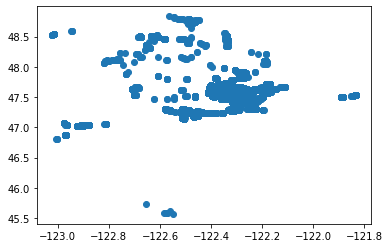

In [79]:
plt.scatter(x, y)

In [40]:
features = []
for path in df.loc[:, 'step_list']:
#     print(path)
    mls = MultiLineString([(x[1], x[0]) for x in path])
#     print(type(mls))
    features.append(Feature(geometry=mls))
gfc = FeatureCollection(features)

In [43]:
with open('seattle_routes.geojson', 'w', encoding='utf-8') as gj_file:
    json.dump(gfc, gj_file)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


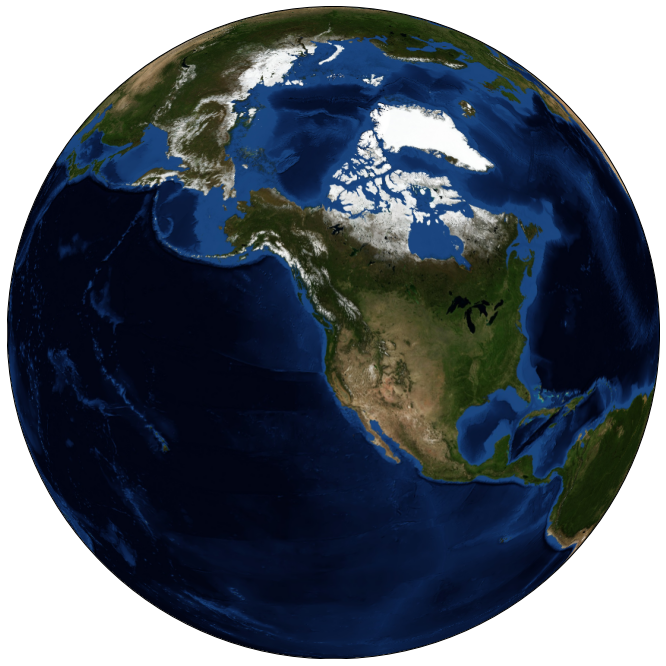

In [75]:
plt.figure(figsize=(12,12))
m = Basemap(projection='ortho', resolution=None, lat_0=avg_lat, lon_0=avg_lon)
m.bluemarble(scale=0.5)

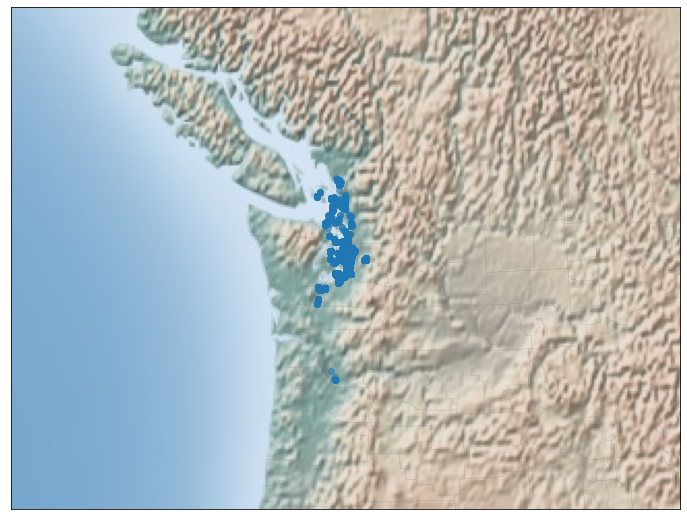

In [98]:
fig = plt.figure(figsize=(12,12))
m = Basemap(projection='lcc', resolution=None, lat_0=avg_lat, lon_0=avg_lon, lat_1=min_y, lat_2=max_y, width=1.2E6, height=.9E6)
m.shadedrelief()
m.drawcounties(color='gray')
m.scatter(x, y, latlon=True, cmap='Reds', alpha=0.5)
plt.show()
# m.bluemarble(scale=0.5)

In [101]:
from arcgis.gis import GIS

In [102]:
my_gis = GIS()
m = my_gis.map()
m

MapView(layout=Layout(height='400px', width='100%'))

In [138]:
curr_gis = get_gis()

In [ ]:
curr_gis

In [139]:
from pathlib import Path
from zipfile import ZipFile

In [140]:
public_data_item_id = 'a04933c045714492bda6886f355416f2'
data_item = curr_gis.content.get(public_data_item_id)

In [107]:
data_path = Path('./data')

if not data_path.exists():
    data_path.mkdir()

In [115]:
zip_path = data_path.joinpath('LAHubDatasets.zip')
extract_path = data_path.joinpath('LA_Hub_datasets')
data_item.download(save_path=data_path)

PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'data\\LAHubDatasets.zip'

In [114]:
zip_file = ZipFile(zip_path)
zip_file.extractall(path=extract_path)
list(file.name for file in extract_path('*'))

TypeError: 'WindowsPath' object is not callable

In [141]:
trailheads_id = '883cedb8c9fe4524b64d47666ed234a7'
curr_gis = get_gis()
trailheads_item = curr_gis.content.get(trailheads_id)
trailheads_item
m = curr_gis.map()
m.add_layer(trailheads_item)

In [142]:
m.center = [34.09042, -118.71511]
m.zoom = 11

In [144]:
m

MapView(jupyter_target='notebook', layout=Layout(height='400px', width='100%'))

In [121]:
type(trailheads_item)

arcgis.gis.Item

In [145]:
query = 'title: "Trailheads*" AND type: "Feature Service"'
search_results = gis.content.search(query=query, max_items=10)
search_results

[<Item title:"Trailheads" type:Feature Layer Collection owner:justinca>,
 <Item title:"Brown Sands Trailheads" type:Feature Layer Collection owner:aemarr_flc>,
 <Item title:"Trailheads" type:Feature Layer Collection owner:agtrenholm>,
 <Item title:"Trailheads" type:Feature Layer Collection owner:hbbiris>,
 <Item title:"Trailheads" type:Feature Layer Collection owner:GEODEV_Brian>,
 <Item title:"Trailheads" type:Feature Layer Collection owner:TWSAdmin>,
 <Item title:"Trailheads" type:Feature Layer Collection owner:chiwa.li>,
 <Item title:"Trailheads" type:Feature Layer Collection owner:duke__>,
 <Item title:"Trailheads" type:Feature Layer Collection owner:gustacro211>,
 <Item title:"Merge_Trailheads30_1hr" type:Feature Layer Collection owner:austintubbs>]

In [146]:
trail_csv_data = search_results[0]

In [147]:
trail_csv_data

<Item title:"Trailheads" type:Feature Layer Collection owner:justinca>

In [148]:
feature_layers = trail_csv_data.layers
trailheads_layer = feature_layers[0]
trailheads_layer.properties.name

Token Required
Token Required
(Error Code: 499)


TypeError: 'NoneType' object is not subscriptable

In [149]:
with open('seattle_routes.json', 'r') as f:
    routes_data = json.load(f)
    
with open('data/LA_Hub_datasets/LA_Hub_Datasets/Trails.geojson', 'r') as f:
    trails_data = json.load(f)

In [152]:
with open('seattle_routes.geojson', 'r') as f:
    geo_routes_data = json.load(f)

In [150]:
from pprint import PrettyPrinter
pp = PrettyPrinter(indent=2)
pp.pprint(routes_data)

[ { 'end_address': '601 N 34th St, Seattle, WA 98103, USA',
    'end_coords': [47.6489043, -122.3504975],
    'start_address': '1900 5th Ave, Seattle, WA 98101, USA',
    'start_coords': [47.614221, -122.3380349],
    'step_list': [ [47.614221, -122.3380349],
                   [47.6174767, -122.3435548],
                   [47.6185586, -122.343616],
                   [47.6220647, -122.3436064],
                   [47.6246644, -122.343588],
                   [47.6271434, -122.3434831],
                   [47.6423049, -122.3468898],
                   [47.6422764, -122.34607],
                   [47.6403776, -122.3444339],
                   [47.64613079999999, -122.3497075],
                   [47.6471088, -122.3497615],
                   [47.6492, -122.3497678],
                   [47.6492167, -122.3473533],
                   [47.6484446, -122.3473653],
                   [47.6489043, -122.3504975]],
    'total_distance': 3.3,
    'unit_distance': 'mi'},
  { 'end_address': 'Boren 

    'start_coords': [47.5372328, -122.2813777],
    'step_list': [ [47.5372328, -122.2813777],
                   [47.5084688, -122.2784178],
                   [47.4998914, -122.2750861],
                   [47.4961272, -122.2703996],
                   [47.470325, -122.2686642],
                   [47.4630681, -122.2840705],
                   [47.4592031, -122.2987157],
                   [47.44826279999999, -122.2984349]],
    'total_distance': 8.0,
    'unit_distance': 'mi'},
  { 'end_address': 'Seattle, WA, USA',
    'end_coords': [47.6063821, -122.3322283],
    'start_address': '2001 W Garfield St, Seattle, WA 98119, USA',
    'start_coords': [47.63292879999999, -122.3801117],
    'step_list': [ [47.63292879999999, -122.3801117],
                   [47.6320322, -122.3801596],
                   [47.6321298, -122.3833957],
                   [47.6326273, -122.3832373],
                   [47.6339262, -122.3865976],
                   [47.6335831, -122.3865876],
                  

    'end_coords': [47.6203819, -122.3384638],
    'start_address': '500 Pine St Suite 200, Seattle, WA 98101, USA',
    'start_coords': [47.6118286, -122.3361314],
    'step_list': [ [47.6118286, -122.3361314],
                   [47.611201, -122.3376162],
                   [47.613056, -122.3400411],
                   [47.6143894, -122.3383186],
                   [47.61483, -122.337746],
                   [47.6203819, -122.3384638]],
    'total_distance': 0.8,
    'unit_distance': 'mi'},
  { 'end_address': '305 Harrison St, Seattle, WA 98109, USA',
    'end_coords': [47.6185886, -122.3509134],
    'start_address': '500 Pine St Suite 200, Seattle, WA 98101, USA',
    'start_coords': [47.6118286, -122.3361314],
    'step_list': [ [47.6118286, -122.3361314],
                   [47.611201, -122.3376162],
                   [47.61857620000001, -122.3489443],
                   [47.6185886, -122.3509134]],
    'total_distance': 0.9,
    'unit_distance': 'mi'},
  { 'end_address': '305 Har

    'start_address': '2001 W Garfield St, Seattle, WA 98119, USA',
    'start_coords': [47.63292879999999, -122.3801117],
    'step_list': [ [47.63292879999999, -122.3801117],
                   [47.6320322, -122.3801596],
                   [47.6321298, -122.3833957],
                   [47.6326273, -122.3832373],
                   [47.6339262, -122.3865976],
                   [47.6335831, -122.3865876],
                   [47.63350579999999, -122.3767265],
                   [47.63302470000001, -122.3761481],
                   [47.6206603, -122.3608597],
                   [47.61864050000001, -122.3574306],
                   [47.6185566, -122.342407],
                   [47.62089230000001, -122.3423968],
                   [47.62087469999999, -122.338454],
                   [47.6203819, -122.3384638]],
    'total_distance': 3.4,
    'unit_distance': 'mi'},
  { 'end_address': '1918 8th Ave, Seattle, WA 98101, USA',
    'end_coords': [47.6155276, -122.3362592],
    'start_address'

    'total_distance': 15.4,
    'unit_distance': 'mi'},
  { 'end_address': '1053 Lake Washington Blvd N, Renton, WA 98056, USA',
    'end_coords': [47.5034071, -122.2051062],
    'start_address': '1101 Dexter Ave N, Seattle, WA 98109, USA',
    'start_coords': [47.6288578, -122.3423083],
    'step_list': [ [47.6288578, -122.3423083],
                   [47.62454349999999, -122.3423623],
                   [47.6245662, -122.3343439],
                   [47.6246452, -122.3333885],
                   [47.6070417, -122.3301053],
                   [47.5945982, -122.3143738],
                   [47.5900797, -122.3002264],
                   [47.588099, -122.2339187],
                   [47.5791313, -122.1884152],
                   [47.5064301, -122.1978432],
                   [47.5029146, -122.1974636],
                   [47.501145, -122.2004062],
                   [47.5026366, -122.1998345],
                   [47.5027742, -122.2003051],
                   [47.5028874, -122.2043069],
 

                   [48.0960634, -122.1900414],
                   [48.0917543, -122.1857114]],
    'total_distance': 52.4,
    'unit_distance': 'mi'},
  { 'end_address': '10600 Quil Ceda Blvd, Tulalip, WA 98271, USA',
    'end_coords': [48.0917543, -122.1857114],
    'start_address': '1208 Bay St, Bellingham, WA 98225, USA',
    'start_coords': [48.7504194, -122.4822656],
    'step_list': [ [48.7504194, -122.4822656],
                   [48.7501431, -122.4826922],
                   [48.7432646, -122.4718335],
                   [48.745022, -122.4717616],
                   [48.74497849999999, -122.4668389],
                   [48.7420761, -122.4675944],
                   [48.1033546, -122.1850502],
                   [48.1006912, -122.1854769],
                   [48.1004691, -122.1917218],
                   [48.0961432, -122.1904063],
                   [48.0960634, -122.1900414],
                   [48.0917543, -122.1857114]],
    'total_distance': 52.6,
    'unit_distance': 'mi'}

    'start_address': '10600 Quil Ceda Blvd, Tulalip, WA 98271, USA',
    'start_coords': [48.09433629999999, -122.1908325],
    'step_list': [ [48.09433629999999, -122.1908325],
                   [48.0960634, -122.1900414],
                   [48.0963421, -122.1902952],
                   [48.1003677, -122.1917292],
                   [48.10005899999999, -122.1849075],
                   [48.465353, -122.3415733],
                   [48.4711292, -122.340603],
                   [48.4632523, -122.5799501],
                   [48.4642084, -122.5829437],
                   [48.4932184, -122.6089883],
                   [48.4963734, -122.6095368],
                   [48.4965206, -122.6314612],
                   [48.5127061, -122.6314035],
                   [48.51274429999999, -122.6361577],
                   [48.4996474, -122.6741508],
                   [48.4988822, -122.6850611],
                   [48.49316349999999, -122.6844072]],
    'total_distance': 48.3,
    'unit_distance': '

                   [47.446603, -122.297169],
                   [47.4499913, -122.2978047],
                   [47.4599358, -122.2971305],
                   [47.46278849999999, -122.2693538],
                   [47.4681337, -122.267579],
                   [47.5876237, -122.3202066],
                   [47.5939482, -122.3200231],
                   [47.60177849999999, -122.3243523],
                   [47.6033165, -122.3262214],
                   [47.60748, -122.3295753],
                   [47.6133623, -122.3155164],
                   [47.6141146, -122.3155336],
                   [47.61411280000001, -122.3158958]],
    'total_distance': 15.1,
    'unit_distance': 'mi'},
  { 'end_address': '19230 Alderwood Mall Pkwy #160, Lynnwood, WA 98036, USA',
    'end_coords': [47.8235663, -122.2710329],
    'start_address': 'Seattle-Tacoma International Airport (SEA), 17801 '
                     'International Blvd, Seattle, WA 98158, USA',
    'start_coords': [47.44826279999999, -122.298434

  { 'end_address': '700 3rd Ave, Seattle, WA 98104, USA',
    'end_coords': [47.603618, -122.3321673],
    'start_address': 'Seattle-Tacoma International Airport (SEA), 17801 '
                     'International Blvd, Seattle, WA 98158, USA',
    'start_coords': [47.44826279999999, -122.2984349],
    'step_list': [ [47.44826279999999, -122.2984349],
                   [47.44815639999999, -122.2982801],
                   [47.446603, -122.297169],
                   [47.4499913, -122.2978047],
                   [47.4599358, -122.2971305],
                   [47.46278849999999, -122.2693538],
                   [47.4681337, -122.267579],
                   [47.5876237, -122.3202066],
                   [47.5939482, -122.3200231],
                   [47.60177849999999, -122.3243523],
                   [47.60462500000001, -122.3269744],
                   [47.602768, -122.3314095],
                   [47.603618, -122.3321673]],
    'total_distance': 14.3,
    'unit_distance': 'mi'},
  {

    'start_coords': [47.6079115, -122.3389055],
    'step_list': [ [47.6079115, -122.3389055],
                   [47.6082831, -122.3380399],
                   [47.605871, -122.335784],
                   [47.6077372, -122.3313743],
                   [47.5957258, -122.3209248],
                   [47.5944699, -122.3209456],
                   [47.4642007, -122.2664857],
                   [47.4376179, -122.2695299],
                   [47.43420649999999, -122.2744431],
                   [47.4345161, -122.2938093],
                   [47.4347565, -122.2937984],
                   [47.435593, -122.2930078]],
    'total_distance': 14.8,
    'unit_distance': 'mi'},
  { 'end_address': '1113 6th Ave, Seattle, WA 98101, USA',
    'end_coords': [47.6083417, -122.3322536],
    'start_address': '1400 1st Ave, Seattle, WA 98101, USA',
    'start_coords': [47.6079115, -122.3389055],
    'step_list': [ [47.6079115, -122.3389055],
                   [47.6082831, -122.3380399],
                   

                   [47.4657267, -122.3009387],
                   [47.4592031, -122.2987157],
                   [47.4536862, -122.3006979],
                   [47.4509777, -122.2998204],
                   [47.450663, -122.2961146],
                   [47.4441688, -122.2962856],
                   [47.443932, -122.2951223],
                   [47.4443233, -122.2953966]],
    'total_distance': 12.6,
    'unit_distance': 'mi'},
  { 'end_address': '2100 Alaskan Way, Seattle, WA 98121, USA',
    'end_coords': [47.61095160000001, -122.3473434],
    'start_address': '800 Occidental Ave S, Seattle, WA 98134, USA',
    'start_coords': [47.5952686, -122.3332592],
    'step_list': [ [47.5952686, -122.3332592],
                   [47.5952547, -122.3332589],
                   [47.5956696, -122.3340873],
                   [47.5964112, -122.3341645],
                   [47.5964819, -122.3354605],
                   [47.59825600000001, -122.3357993],
                   [47.6107605, -122.3475848],


    'start_coords': [47.6098502, -122.3424803],
    'step_list': [ [47.6098502, -122.3424803],
                   [47.6104203, -122.3434447],
                   [47.6137429, -122.3391856],
                   [47.6079746, -122.3331043],
                   [47.607654, -122.3338695]],
    'total_distance': 0.9,
    'unit_distance': 'mi'},
  { 'end_address': '18740 International Blvd, Seattle, WA 98188, USA',
    'end_coords': [47.435593, -122.2930078],
    'start_address': '1908 Pike Pl, Seattle, WA 98101, USA',
    'start_coords': [47.6098502, -122.3424803],
    'step_list': [ [47.6098502, -122.3424803],
                   [47.6104203, -122.3434447],
                   [47.6103294, -122.3436776],
                   [47.6049435, -122.3380085],
                   [47.6077372, -122.3313743],
                   [47.5957258, -122.3209248],
                   [47.5944699, -122.3209456],
                   [47.4642007, -122.2664857],
                   [47.4376179, -122.2695299],
              

    'step_list': [ [47.614951, -122.3194499],
                   [47.61526, -122.319453],
                   [47.611662, -122.3364918],
                   [47.6100971, -122.3350631]],
    'total_distance': 1.0,
    'unit_distance': 'mi'},
  { 'end_address': '2100 Alaskan Way, Seattle, WA 98121, USA',
    'end_coords': [47.61095160000001, -122.3473434],
    'start_address': '1525 10th Ave, Seattle, WA 98122, USA',
    'start_coords': [47.614951, -122.3194499],
    'step_list': [ [47.614951, -122.3194499],
                   [47.611756, -122.31935],
                   [47.6037971, -122.3384196],
                   [47.6107605, -122.3475848],
                   [47.61095160000001, -122.3473434]],
    'total_distance': 1.9,
    'unit_distance': 'mi'},
  { 'end_address': '17620 International Blvd, Seattle, WA 98188, USA',
    'end_coords': [47.4443233, -122.2953966],
    'start_address': '1525 10th Ave, Seattle, WA 98122, USA',
    'start_coords': [47.614951, -122.3194499],
    'step_list':

    'start_coords': [47.51774959999999, -122.2973513],
    'step_list': [ [47.51774959999999, -122.2973513],
                   [47.5448701, -122.3311735],
                   [47.566765, -122.3392871],
                   [47.625416, -122.3435791],
                   [47.6254122, -122.3423694],
                   [47.62454349999999, -122.3423623],
                   [47.6245302, -122.3462682],
                   [47.62541900000001, -122.3462726],
                   [47.62541359999999, -122.3449758],
                   [47.6251322, -122.3449769]],
    'total_distance': 8.7,
    'unit_distance': 'mi'},
  { 'end_address': '99 Union St, Seattle, WA 98101, USA',
    'end_coords': [47.6076645, -122.339495],
    'start_address': '9404 E Marginal Way S, Seattle, WA 98108, USA',
    'start_coords': [47.51774959999999, -122.2973513],
    'step_list': [ [47.51774959999999, -122.2973513],
                   [47.5083814, -122.2915576],
                   [47.5072359, -122.2911709],
                 

                   [47.6086989, -122.3337585],
                   [47.6079746, -122.3331043],
                   [47.607654, -122.3338695]],
    'total_distance': 0.3,
    'unit_distance': 'mi'},
  { 'end_address': '17801 International Blvd, Seattle, WA 98158, USA',
    'end_coords': [47.4405843, -122.2975586],
    'start_address': '1300 1st Ave, Seattle, WA 98101, USA',
    'start_coords': [47.6074851, -122.3372604],
    'step_list': [ [47.6074851, -122.3372604],
                   [47.605871, -122.335784],
                   [47.6077372, -122.3313743],
                   [47.5957258, -122.3209248],
                   [47.5944699, -122.3209456],
                   [47.4642007, -122.2664857],
                   [47.4376179, -122.2695299],
                   [47.43420649999999, -122.2744431],
                   [47.4346126, -122.297901],
                   [47.4405843, -122.2975586]],
    'total_distance': 15.2,
    'unit_distance': 'mi'},
  { 'end_address': '18740 International Blvd, S

    'unit_distance': 'mi'},
  { 'end_address': '1415 5th Ave, Seattle, WA 98101, USA',
    'end_coords': [47.6100971, -122.3350631],
    'start_address': '6009 244th St SW, Mountlake Terrace, WA 98043, USA',
    'start_coords': [47.7789087, -122.314465],
    'step_list': [ [47.7789087, -122.314465],
                   [47.77868050000001, -122.3144287],
                   [47.7788335, -122.3138157],
                   [47.778411, -122.3135305],
                   [47.7785058, -122.3132709],
                   [47.7778303, -122.3126645],
                   [47.7776157, -122.3132363],
                   [47.7776941, -122.3180706],
                   [47.7724267, -122.3202545],
                   [47.6122333, -122.330814],
                   [47.6107852, -122.332055],
                   [47.6092253, -122.3357939],
                   [47.610205, -122.3367117],
                   [47.6106724, -122.3355888],
                   [47.6100971, -122.3350631]],
    'total_distance': 13.0,
    'unit

    'unit_distance': 'mi'},
  { 'end_address': '1101 4th Ave, Seattle, WA 98101, USA',
    'end_coords': [47.6071107, -122.3338507],
    'start_address': '700 Bellevue Way NE #310, Bellevue, WA 98004, USA',
    'start_coords': [47.6167425, -122.2016235],
    'step_list': [ [47.6167425, -122.2016235],
                   [47.64106719999999, -122.2010162],
                   [47.6428073, -122.2015373],
                   [47.6429093, -122.317002],
                   [47.6103676, -122.3314348],
                   [47.6060141, -122.329692],
                   [47.6056051, -122.3293651],
                   [47.60465989999999, -122.331606],
                   [47.6071107, -122.3338507]],
    'total_distance': 10.7,
    'unit_distance': 'mi'},
  { 'end_address': '2125 Terry Ave, Seattle, WA 98121, USA',
    'end_coords': [47.6180792, -122.3375439],
    'start_address': '700 Bellevue Way NE #310, Bellevue, WA 98004, USA',
    'start_coords': [47.6167425, -122.2016235],
    'step_list': [ [47.61

  { 'end_address': '700 3rd Ave, Seattle, WA 98104, USA',
    'end_coords': [47.603618, -122.3321673],
    'start_address': '305 Harrison St, Seattle, WA 98109, USA',
    'start_coords': [47.621395, -122.3543661],
    'step_list': [ [47.621395, -122.3543661],
                   [47.6211064, -122.3541473],
                   [47.6197713, -122.3541462],
                   [47.6197724, -122.352845],
                   [47.6185914, -122.3528686],
                   [47.604445, -122.334479],
                   [47.6049085, -122.3333693],
                   [47.603618, -122.3321673]],
    'total_distance': 1.8,
    'unit_distance': 'mi'},
  { 'end_address': '99 Union St, Seattle, WA 98101, USA',
    'end_coords': [47.6076645, -122.339495],
    'start_address': '305 Harrison St, Seattle, WA 98109, USA',
    'start_coords': [47.621395, -122.3543661],
    'step_list': [ [47.621395, -122.3543661],
                   [47.6211064, -122.3541473],
                   [47.6197713, -122.3541462],
     

    'start_address': '37500 SE North Bend Way, Snoqualmie, WA 98065, USA',
    'start_coords': [47.5160972, -121.8432971],
    'step_list': [ [47.5160972, -121.8432971],
                   [47.514045, -121.8484348],
                   [47.580352, -122.1658652],
                   [47.5751679, -122.1755604],
                   [47.4626432, -122.266379],
                   [47.4630681, -122.2840705],
                   [47.4637756, -122.2901098],
                   [47.4441688, -122.2962856],
                   [47.443932, -122.2951223],
                   [47.4443233, -122.2953966]],
    'total_distance': 31.8,
    'unit_distance': 'mi'},
  { 'end_address': '2100 Alaskan Way, Seattle, WA 98121, USA',
    'end_coords': [47.61095160000001, -122.3473434],
    'start_address': '37500 SE North Bend Way, Snoqualmie, WA 98065, USA',
    'start_coords': [47.5160972, -121.8432971],
    'step_list': [ [47.5160972, -121.8432971],
                   [47.514045, -121.8484348],
                   [47

                   [47.6852969, -122.3175234],
                   [47.68528149999999, -122.3151408],
                   [47.6825653, -122.3180291],
                   [47.6299038, -122.3271038],
                   [47.6247595, -122.3343763],
                   [47.6245618, -122.3475056],
                   [47.6207394, -122.3476557],
                   [47.6198121, -122.3488345],
                   [47.62017119999999, -122.3492968]],
    'total_distance': 6.1,
    'unit_distance': 'mi'},
  { 'end_address': '700 3rd Ave, Seattle, WA 98104, USA',
    'end_coords': [47.603618, -122.3321673],
    'start_address': 'Roosevelt Way NE, Seattle, WA 98115, USA',
    'start_coords': [47.6912794, -122.3176141],
    'step_list': [ [47.6912794, -122.3176141],
                   [47.6852969, -122.3175234],
                   [47.68528149999999, -122.3151408],
                   [47.6825653, -122.3180291],
                   [47.6103676, -122.3314348],
                   [47.6060141, -122.329692],
   

                   [47.6591858, -122.3011364],
                   [47.6449755, -122.3047662],
                   [47.6429093, -122.317002],
                   [47.6229699, -122.3286695],
                   [47.6200123, -122.3291151],
                   [47.6197203, -122.3291034],
                   [47.6184905, -122.3307124],
                   [47.6185267, -122.3352706],
                   [47.61782909999999, -122.3361838],
                   [47.6181511, -122.336749],
                   [47.6179368, -122.3370534],
                   [47.6179983, -122.3374551],
                   [47.6180792, -122.3375439]],
    'total_distance': 4.6,
    'unit_distance': 'mi'},
  { 'end_address': '1000 4th Ave, Seattle, WA 98104, USA',
    'end_coords': [47.60691980000001, -122.3321354],
    'start_address': '4000 15th Ave NE, Seattle, WA 98195, USA',
    'start_coords': [47.6561464, -122.3071993],
    'step_list': [ [47.6561464, -122.3071993],
                   [47.6580447, -122.3050377],
         

    'start_coords': [47.6063821, -122.3322283],
    'step_list': [ [47.6063821, -122.3322283],
                   [47.60609780000001, -122.3329141],
                   [47.6068051, -122.3335615],
                   [47.6072777, -122.3324649],
                   [47.6058396, -122.3311509],
                   [47.60625, -122.330156],
                   [47.60690719999999, -122.3305959]],
    'total_distance': 0.4,
    'unit_distance': 'mi'},
  { 'end_address': '1113 6th Ave, Seattle, WA 98101, USA',
    'end_coords': [47.6083417, -122.3322536],
    'start_address': 'Seattle, WA, USA',
    'start_coords': [47.6063821, -122.3322283],
    'step_list': [ [47.6063821, -122.3322283],
                   [47.60609780000001, -122.3329141],
                   [47.6068051, -122.3335615],
                   [47.6077372, -122.3313743],
                   [47.6084576, -122.3319902],
                   [47.6083417, -122.3322536]],
    'total_distance': 0.3,
    'unit_distance': 'mi'},
  { 'end_address'

    'unit_distance': 'mi'},
  { 'end_address': '3201 S 176th St, Seattle, WA 98188, USA',
    'end_coords': [47.4444704, -122.2913078],
    'start_address': '1118 E Pike St, Seattle, WA 98122, USA',
    'start_coords': [47.6141005, -122.3173122],
    'step_list': [ [47.6141005, -122.3173122],
                   [47.6140982, -122.316843],
                   [47.6129344, -122.3167931],
                   [47.6070145, -122.3306952],
                   [47.6074971, -122.3311539],
                   [47.5979215, -122.321403],
                   [47.5957258, -122.3209248],
                   [47.5944699, -122.3209456],
                   [47.4642007, -122.2664857],
                   [47.4376179, -122.2695299],
                   [47.43420649999999, -122.2744431],
                   [47.4343996, -122.2816938],
                   [47.4451918, -122.2815073],
                   [47.4452472, -122.291319],
                   [47.4446997, -122.2913448],
                   [47.4444704, -122.2913078

    'unit_distance': 'mi'},
  { 'end_address': 'Seattle Ferry Terminal, Seattle, WA 98104, USA',
    'end_coords': [47.6023223, -122.3378325],
    'start_address': '1506 6th Ave, Seattle, WA 98101, USA',
    'start_coords': [47.61157069999999, -122.3348579],
    'step_list': [ [47.61157069999999, -122.3348579],
                   [47.6121416, -122.3353839],
                   [47.6102763, -122.3398094],
                   [47.60515789999999, -122.335131],
                   [47.6037971, -122.3384196],
                   [47.5992069, -122.3359388],
                   [47.6016622, -122.3366216],
                   [47.6023223, -122.3378325]],
    'total_distance': 1.5,
    'unit_distance': 'mi'},
  { 'end_address': '1400 6th Ave, Seattle, WA 98101, USA',
    'end_coords': [47.6106084, -122.3339786],
    'start_address': '1506 6th Ave, Seattle, WA 98101, USA',
    'start_coords': [47.61157069999999, -122.3348579],
    'step_list': [ [47.61157069999999, -122.3348579],
                   [4

    'unit_distance': 'mi'},
  { 'end_address': '2125 Terry Ave, Seattle, WA 98121, USA',
    'end_coords': [47.6180792, -122.3375439],
    'start_address': '19230 Alderwood Mall Pkwy #160, Lynnwood, WA 98036, USA',
    'start_coords': [47.8235663, -122.2710329],
    'step_list': [ [47.8235663, -122.2710329],
                   [47.8235609, -122.2709888],
                   [47.8208675, -122.2710854],
                   [47.8209803, -122.2829085],
                   [47.8157804, -122.2892996],
                   [47.6229699, -122.3286695],
                   [47.6200123, -122.3291151],
                   [47.6197203, -122.3291034],
                   [47.6184905, -122.3307124],
                   [47.6185267, -122.3352706],
                   [47.61782909999999, -122.3361838],
                   [47.6181511, -122.336749],
                   [47.6179368, -122.3370534],
                   [47.6179983, -122.3374551],
                   [47.6180792, -122.3375439]],
    'total_distance': 16.

                   [47.6254125, -122.3443722],
                   [47.6252694, -122.3445728]],
    'total_distance': 5.1,
    'unit_distance': 'mi'},
  { 'end_address': '99 Union St, Seattle, WA 98101, USA',
    'end_coords': [47.6076645, -122.339495],
    'start_address': '7201 East Green Lake Dr N, Seattle, WA 98115, USA',
    'start_coords': [47.680678, -122.328033],
    'step_list': [ [47.680678, -122.328033],
                   [47.6816402, -122.3275073],
                   [47.6797243, -122.3257094],
                   [47.6745569, -122.3211278],
                   [47.6695855, -122.3221702],
                   [47.6122333, -122.330814],
                   [47.6107852, -122.332055],
                   [47.6076645, -122.339495]],
    'total_distance': 5.6,
    'unit_distance': 'mi'},
  { 'end_address': '1000 1st Ave, Seattle, WA 98104, USA',
    'end_coords': [47.6049169, -122.3364675],
    'start_address': '7201 East Green Lake Dr N, Seattle, WA 98115, USA',
    'start_coords': [

                   [47.44524149999999, -122.2963493],
                   [47.4452472, -122.291319],
                   [47.4446997, -122.2913448],
                   [47.4444704, -122.2913078]],
    'total_distance': 14.4,
    'unit_distance': 'mi'},
  { 'end_address': '1101 4th Ave, Seattle, WA 98101, USA',
    'end_coords': [47.6071107, -122.3338507],
    'start_address': 'Alki Beach Park, 1702 Alki Ave SW, Seattle, WA 98116, '
                     'USA',
    'start_coords': [47.5789256, -122.4112832],
    'step_list': [ [47.5789256, -122.4112832],
                   [47.5791099, -122.4106505],
                   [47.5759123, -122.4107371],
                   [47.5715137, -122.3712798],
                   [47.5713997, -122.366782],
                   [47.5715039, -122.3629265],
                   [47.57152500000001, -122.3618842],
                   [47.5720996, -122.3600862],
                   [47.54037580000001, -122.3422062],
                   [47.53801259999999, -122.3343819],


    'total_distance': 1.6,
    'unit_distance': 'mi'},
  { 'end_address': '1000 4th Ave, Seattle, WA 98104, USA',
    'end_coords': [47.60691980000001, -122.3321354],
    'start_address': 'Discovery Park, 3801 Discovery Park Blvd, Seattle, WA '
                     '98199, USA',
    'start_coords': [47.6582413, -122.4060229],
    'step_list': [ [47.6582413, -122.4060229],
                   [47.65849129999999, -122.4054469],
                   [47.6583405, -122.4036943],
                   [47.6611857, -122.3939227],
                   [47.6558678, -122.3864326],
                   [47.6537021, -122.3762602],
                   [47.63285010000001, -122.3760857],
                   [47.6206603, -122.3608597],
                   [47.61864050000001, -122.3574306],
                   [47.6185745, -122.347419],
                   [47.60691980000001, -122.3321354]],
    'total_distance': 6.0,
    'unit_distance': 'mi'},
  { 'end_address': '305 Harrison St, Seattle, WA 98109, USA',
    'end_c

    'end_coords': [47.6203717, -122.3593736],
    'start_address': '305 Harrison St, Seattle, WA 98109, USA',
    'start_coords': [47.6185886, -122.3509134],
    'step_list': [ [47.6185886, -122.3509134],
                   [47.61864050000001, -122.3574306],
                   [47.6198813, -122.3594882],
                   [47.6203717, -122.3593736]],
    'total_distance': 0.5,
    'unit_distance': 'mi'},
  { 'end_address': 'Edmonds, 199 Sunset Ave S, Edmonds, WA 98020, USA',
    'end_coords': [47.8124792, -122.382897],
    'start_address': '305 Harrison St, Seattle, WA 98109, USA',
    'start_coords': [47.6245657, -122.3515193],
    'step_list': [ [47.6245657, -122.3515193],
                   [47.6245662, -122.3343439],
                   [47.6246452, -122.3333885],
                   [47.6267152, -122.3284704],
                   [47.7719674, -122.3202433],
                   [47.7963715, -122.3766248],
                   [47.80972480000001, -122.3832437],
                   [47.812

                   [47.65824, -122.6852515],
                   [47.65819390000001, -122.6867107],
                   [47.6374488, -122.7021599],
                   [47.63691679999999, -122.7082697],
                   [47.5277175, -122.6998918],
                   [47.2325391, -122.4631686],
                   [47.229919, -122.4474448],
                   [47.6058299, -122.3286403],
                   [47.6084141, -122.3319519],
                   [47.6084576, -122.3319902],
                   [47.6074897, -122.3342094],
                   [47.61960329999999, -122.3490632],
                   [47.61972309999999, -122.3489092],
                   [47.62017119999999, -122.3492968]],
    'total_distance': 72.5,
    'unit_distance': 'mi'},
  { 'end_address': '3201 S 176th St, Seattle, WA 98188, USA',
    'end_coords': [47.4444704, -122.2913078],
    'start_address': '10516 Silverdale Way NW #130, Silverdale, WA 98383, USA',
    'start_coords': [47.6585633, -122.6850218],
    'step_list': 

                   [47.6527664, -122.345979],
                   [47.6526283, -122.3475825],
                   [47.65237579999999, -122.3481464],
                   [47.6520959, -122.347844],
                   [47.6246512, -122.3437773],
                   [47.62206399999999, -122.3437648],
                   [47.6220574, -122.3423814],
                   [47.6185566, -122.342407],
                   [47.6185375, -122.3371705],
                   [47.6181511, -122.336749],
                   [47.6179368, -122.3370534],
                   [47.6179983, -122.3374551],
                   [47.6180792, -122.3375439]],
    'total_distance': 3.1,
    'unit_distance': 'mi'},
  { 'end_address': '1400 6th Ave, Seattle, WA 98101, USA',
    'end_coords': [47.6106084, -122.3339786],
    'start_address': '13201 Aurora Ave N, Seattle, WA 98133, USA',
    'start_coords': [47.7260047, -122.3464604],
    'step_list': [ [47.7260047, -122.3464604],
                   [47.7260982, -122.346058],
          

  { 'end_address': '99 Union St, Seattle, WA 98101, USA',
    'end_coords': [47.6076645, -122.339495],
    'start_address': '1416 NW Ballard Way, Seattle, WA 98107, USA',
    'start_coords': [47.66293820000001, -122.3746329],
    'step_list': [ [47.66293820000001, -122.3746329],
                   [47.6629371, -122.3736999],
                   [47.6636658, -122.3735319],
                   [47.6636673, -122.3760846],
                   [47.6616973, -122.376252],
                   [47.63285010000001, -122.3760857],
                   [47.6206603, -122.3608597],
                   [47.6111695, -122.344841],
                   [47.6118548, -122.3439363],
                   [47.6078204, -122.3391182],
                   [47.6076645, -122.339495]],
    'total_distance': 4.9,
    'unit_distance': 'mi'},
  { 'end_address': '1000 1st Ave, Seattle, WA 98104, USA',
    'end_coords': [47.6049169, -122.3364675],
    'start_address': '1416 NW Ballard Way, Seattle, WA 98107, USA',
    'start_coords

    'end_coords': [47.6100971, -122.3350631],
    'start_address': 'Lake Union Park, 860 Terry Ave N, Seattle, WA 98109, USA',
    'start_coords': [47.6272029, -122.3371192],
    'step_list': [ [47.6272029, -122.3371192],
                   [47.6257397, -122.3362127],
                   [47.6257357, -122.3344256],
                   [47.6247595, -122.3343763],
                   [47.6246452, -122.3333885],
                   [47.6122333, -122.330814],
                   [47.6107852, -122.332055],
                   [47.6092253, -122.3357939],
                   [47.610205, -122.3367117],
                   [47.6106724, -122.3355888],
                   [47.6100971, -122.3350631]],
    'total_distance': 2.0,
    'unit_distance': 'mi'},
  { 'end_address': '601 Roy St, Seattle, WA 98109, USA',
    'end_coords': [47.6251322, -122.3449769],
    'start_address': 'Lake Union Park, 860 Terry Ave N, Seattle, WA 98109, USA',
    'start_coords': [47.6272029, -122.3371192],
    'step_list': [ [47.

    'unit_distance': 'mi'},
  { 'end_address': 'Edmonds, 199 Sunset Ave S, Edmonds, WA 98020, USA',
    'end_coords': [47.8124792, -122.382897],
    'start_address': '1000 4th Ave, Seattle, WA 98104, USA',
    'start_coords': [47.60691980000001, -122.3321354],
    'step_list': [ [47.60691980000001, -122.3321354],
                   [47.6044125, -122.3298454],
                   [47.605118, -122.328113],
                   [47.7719674, -122.3202433],
                   [47.7963715, -122.3766248],
                   [47.80972480000001, -122.3832437],
                   [47.8122173, -122.381884],
                   [47.81258949999999, -122.382693],
                   [47.8124792, -122.382897]],
    'total_distance': 17.7,
    'unit_distance': 'mi'},
  { 'end_address': '3201 S 176th St, Seattle, WA 98188, USA',
    'end_coords': [47.4444704, -122.2913078],
    'start_address': '1000 4th Ave, Seattle, WA 98104, USA',
    'start_coords': [47.6064648, -122.3332503],
    'step_list': [ [47.606

    'start_coords': [47.4428844, -122.2273761],
    'step_list': [ [47.4428844, -122.2273761],
                   [47.44114829999999, -122.2273344],
                   [47.4413872, -122.2603129],
                   [47.4378633, -122.263113],
                   [47.4425997, -122.2641739],
                   [47.4451899, -122.2750346],
                   [47.4329255, -122.2733125],
                   [47.4345161, -122.2938093],
                   [47.4347565, -122.2937984],
                   [47.435593, -122.2930078]],
    'total_distance': 4.9,
    'unit_distance': 'mi'},
  { 'end_address': '2100 Alaskan Way, Seattle, WA 98121, USA',
    'end_coords': [47.61095160000001, -122.3473434],
    'start_address': '601 SW 41st St, Renton, WA 98057, USA',
    'start_coords': [47.4428844, -122.2273761],
    'step_list': [ [47.4428844, -122.2273761],
                   [47.4438587, -122.2273661],
                   [47.4438829, -122.2327837],
                   [47.46782830000001, -122.2336112],


    'total_distance': 1.1,
    'unit_distance': 'mi'},
  { 'end_address': '1113 6th Ave, Seattle, WA 98101, USA',
    'end_coords': [47.6083417, -122.3322536],
    'start_address': 'Seattle Ferry Terminal, Seattle, WA 98104, USA',
    'start_coords': [47.6023223, -122.3378325],
    'step_list': [ [47.6023223, -122.3378325],
                   [47.60300789999999, -122.3382434],
                   [47.60625, -122.330156],
                   [47.6084576, -122.3319902],
                   [47.6083417, -122.3322536]],
    'total_distance': 0.7,
    'unit_distance': 'mi'},
  { 'end_address': '411 University St, Seattle, WA 98101, USA',
    'end_coords': [47.6077009, -122.3344156],
    'start_address': 'Seattle Ferry Terminal, Seattle, WA 98104, USA',
    'start_coords': [47.6023223, -122.3378325],
    'step_list': [ [47.6023223, -122.3378325],
                   [47.60300789999999, -122.3382434],
                   [47.6053803, -122.3322641],
                   [47.6077009, -122.3344156]],
 

    'start_address': '1900 5th Ave, Seattle, WA 98101, USA',
    'start_coords': [47.6131333, -122.3381446],
    'step_list': [ [47.6131333, -122.3381446],
                   [47.6065586, -122.3318028],
                   [47.60609780000001, -122.3329141],
                   [47.6071107, -122.3338507]],
    'total_distance': 0.7,
    'unit_distance': 'mi'},
  { 'end_address': '226 7th Ave N, Seattle, WA 98109, USA',
    'end_coords': [47.6203244, -122.3436986],
    'start_address': '1900 5th Ave, Seattle, WA 98101, USA',
    'start_coords': [47.614221, -122.3380349],
    'step_list': [ [47.614221, -122.3380349],
                   [47.6174767, -122.3435548],
                   [47.6185586, -122.343616],
                   [47.6203244, -122.3436986]],
    'total_distance': 0.5,
    'unit_distance': 'mi'},
  { 'end_address': '2125 Terry Ave, Seattle, WA 98121, USA',
    'end_coords': [47.6180792, -122.3375439],
    'start_address': '1900 5th Ave, Seattle, WA 98101, USA',
    'start_coord

    'unit_distance': 'mi'},
  { 'end_address': '2125 Terry Ave, Seattle, WA 98121, USA',
    'end_coords': [47.6180792, -122.3375439],
    'start_address': '515 Madison St, Seattle, WA 98104, USA',
    'start_coords': [47.6068445, -122.3311121],
    'step_list': [ [47.6068445, -122.3311121],
                   [47.60609780000001, -122.3329141],
                   [47.613056, -122.3400411],
                   [47.6143894, -122.3383186],
                   [47.6170369, -122.3348625],
                   [47.6181511, -122.336749],
                   [47.6179368, -122.3370534],
                   [47.6179983, -122.3374551],
                   [47.6180792, -122.3375439]],
    'total_distance': 1.2,
    'unit_distance': 'mi'},
  { 'end_address': '1112 4th Ave, Seattle, WA 98101, USA',
    'end_coords': [47.607654, -122.3338695],
    'start_address': '900 Bellevue Way NE, Bellevue, WA 98004, USA',
    'start_coords': [47.61842069999999, -122.2016338],
    'step_list': [ [47.61842069999999, -12

    'step_list': [ [47.435593, -122.2930078],
                   [47.4347565, -122.2937984],
                   [47.4345161, -122.2938093],
                   [47.4366396, -122.3180971],
                   [47.4373624, -122.3194653],
                   [47.5472404, -122.3337395],
                   [47.5914469, -122.33645],
                   [47.5964819, -122.3354605],
                   [47.59825600000001, -122.3357993],
                   [47.6133284, -122.352168],
                   [47.6145976, -122.350544],
                   [47.6198813, -122.3594882],
                   [47.6203717, -122.3593736]],
    'total_distance': 14.9,
    'unit_distance': 'mi'},
  { 'end_address': '3201 S 176th St, Seattle, WA 98188, USA',
    'end_coords': [47.4444704, -122.2913078],
    'start_address': '18740 International Blvd, Seattle, WA 98188, USA',
    'start_coords': [47.435593, -122.2930078],
    'step_list': [ [47.435593, -122.2930078],
                   [47.4347565, -122.2937984],
         

    'step_list': [ [47.6100971, -122.3350631],
                   [47.6065586, -122.3318028],
                   [47.6037971, -122.3384196],
                   [47.6107605, -122.3475848],
                   [47.61095160000001, -122.3473434]],
    'total_distance': 1.3,
    'unit_distance': 'mi'},
  { 'end_address': '620 Stewart St, Seattle, WA 98101, USA',
    'end_coords': [47.6141051, -122.3363899],
    'start_address': '1415 5th Ave, Seattle, WA 98101, USA',
    'start_coords': [47.6100971, -122.3350631],
    'step_list': [ [47.6100971, -122.3350631],
                   [47.60968339999999, -122.3346808],
                   [47.6092253, -122.3357939],
                   [47.613056, -122.3400411],
                   [47.6143894, -122.3383186],
                   [47.615055, -122.337456],
                   [47.61428600000001, -122.336156],
                   [47.6141051, -122.3363899]],
    'total_distance': 0.7,
    'unit_distance': 'mi'},
  { 'end_address': '17620 International Blvd

    'unit_distance': 'mi'},
  { 'end_address': '6501 Railroad Ave, Snoqualmie, WA 98065, USA',
    'end_coords': [47.5423197, -121.8366769],
    'start_address': '17620 International Blvd, Seattle, WA 98188, USA',
    'start_coords': [47.4443233, -122.2953966],
    'step_list': [ [47.4443233, -122.2953966],
                   [47.4439272, -122.2956016],
                   [47.4436532, -122.2962493],
                   [47.4405069, -122.2960663],
                   [47.4599358, -122.2971305],
                   [47.4624197, -122.2686625],
                   [47.5747334, -122.1754094],
                   [47.5072023, -121.8903526],
                   [47.5075792, -121.8839094],
                   [47.5087434, -121.8836733],
                   [47.5096991, -121.8834543],
                   [47.5368739, -121.8313558],
                   [47.5405857, -121.8329813],
                   [47.5429392, -121.8365657],
                   [47.5428946, -121.8367536],
                   [47.5423197, -

    'end_coords': [47.6072677, -122.1894233],
    'start_address': '99 Union St, Seattle, WA 98101, USA',
    'start_coords': [47.6076645, -122.339495],
    'step_list': [ [47.6076645, -122.339495],
                   [47.6078204, -122.3391182],
                   [47.6053954, -122.3369169],
                   [47.6077372, -122.3313743],
                   [47.5973602, -122.3211492],
                   [47.5945982, -122.3143738],
                   [47.5900797, -122.3002264],
                   [47.588099, -122.2339187],
                   [47.5795951, -122.1966667],
                   [47.5832937, -122.1883575],
                   [47.5932661, -122.194811],
                   [47.5975158, -122.1931132],
                   [47.607324, -122.1907707],
                   [47.6072677, -122.1894233]],
    'total_distance': 10.4,
    'unit_distance': 'mi'},
  { 'end_address': 'Seattle, WA 98164, USA',
    'end_coords': [47.6063821, -122.3322283],
    'start_address': '99 Union St, Seattle, W

    'unit_distance': 'mi'},
  { 'end_address': '401 Lenora St, Seattle, WA 98121, USA',
    'end_coords': [47.6136335, -122.3410064],
    'start_address': '6501 Railroad Ave, Snoqualmie, WA 98065, USA',
    'start_coords': [47.5423197, -121.8366769],
    'step_list': [ [47.5423197, -121.8366769],
                   [47.5423728, -121.8365307],
                   [47.5413042, -121.8347754],
                   [47.5407713, -121.8332131],
                   [47.5369624, -121.8314318],
                   [47.5096991, -121.8834543],
                   [47.5905783, -122.3081205],
                   [47.5950162, -122.3146307],
                   [47.6033165, -122.3262214],
                   [47.60748, -122.3295753],
                   [47.60609780000001, -122.3329141],
                   [47.6136335, -122.3410064]],
    'total_distance': 28.9,
    'unit_distance': 'mi'},
  { 'end_address': '2125 Terry Ave, Seattle, WA 98121, USA',
    'end_coords': [47.6180792, -122.3375439],
    'start_addre

    'end_coords': [47.1948114, -122.4539577],
    'start_address': 'Seattle-Tacoma International Airport (SEA), 17801 '
                     'International Blvd, Seattle, WA 98158, USA',
    'start_coords': [47.44826279999999, -122.2984349],
    'step_list': [ [47.44826279999999, -122.2984349],
                   [47.44815639999999, -122.2982801],
                   [47.446603, -122.297169],
                   [47.4499913, -122.2978047],
                   [47.4599358, -122.2971305],
                   [47.4624197, -122.2686625],
                   [47.2119174, -122.4624266],
                   [47.2093162, -122.4623748],
                   [47.2064251, -122.4619147],
                   [47.20644189999999, -122.4524391],
                   [47.195567, -122.452459],
                   [47.1955693, -122.4539863],
                   [47.1948114, -122.4539577]],
    'total_distance': 28.3,
    'unit_distance': 'mi'},
  { 'end_address': 'Ruston Way, Washington, USA',
    'end_coords': [47.2

    'start_coords': [47.6110304, -122.3480433],
    'step_list': [ [47.6110304, -122.3480433],
                   [47.5964804, -122.3356867],
                   [47.5481124, -122.3342164],
                   [47.4371881, -122.3191506],
                   [47.4366396, -122.3180971],
                   [47.43451839999999, -122.2980231],
                   [47.4327836, -122.2981932],
                   [47.4327209, -122.2976565]],
    'total_distance': 13.8,
    'unit_distance': 'mi'},
  { 'end_address': '31910 Gateway Center Blvd S, Federal Way, WA 98003, USA',
    'end_coords': [47.3159236, -122.3000278],
    'start_address': 'Seattle, WA 98121, USA',
    'start_coords': [47.6110304, -122.3480433],
    'step_list': [ [47.6110304, -122.3480433],
                   [47.6045031, -122.3391027],
                   [47.6077372, -122.3313743],
                   [47.5957258, -122.3209248],
                   [47.5944699, -122.3209456],
                   [47.4642007, -122.2664857],
           

    'unit_distance': 'mi'},
  { 'end_address': '31910 Gateway Center Blvd S, Federal Way, WA 98003, USA',
    'end_coords': [47.3159236, -122.3000278],
    'start_address': '3600 Southcenter Mall, Tukwila, WA 98188, USA',
    'start_coords': [47.4575237, -122.2595933],
    'step_list': [ [47.4575237, -122.2595933],
                   [47.4558899, -122.259563],
                   [47.4559075, -122.2623384],
                   [47.4575085, -122.2623832],
                   [47.4589569, -122.2655292],
                   [47.3189684, -122.2962308],
                   [47.3151913, -122.3013768],
                   [47.3161099, -122.3003036],
                   [47.31583699999999, -122.3001845],
                   [47.3159236, -122.3000278]],
    'total_distance': 11.2,
    'unit_distance': 'mi'},
  { 'end_address': '1525 1st Ave #16, Seattle, WA 98101, USA',
    'end_coords': [47.6095595, -122.3406994],
    'start_address': '2502 S Tyler St, Tacoma, WA 98405, USA',
    'start_coords': [47.2

    'start_coords': [47.4985372, -122.2031385],
    'step_list': [ [47.4985372, -122.2031385],
                   [47.4988567, -122.2023549],
                   [47.4827907, -122.2021903],
                   [47.4812161, -122.2042033],
                   [47.4756318, -122.2045895],
                   [47.47296, -122.2088412],
                   [47.4698991, -122.2229904],
                   [47.4660778, -122.2233314],
                   [47.466145, -122.219758],
                   [47.4636833, -122.2184678],
                   [47.4636814, -122.2188791],
                   [47.4635151, -122.2188612],
                   [47.46352, -122.2196993],
                   [47.4633319, -122.2195008]],
    'total_distance': 3.4,
    'unit_distance': 'mi'},
  { 'end_address': '2824 S 188th St, Seattle, WA 98188, USA',
    'end_coords': [47.4354746, -122.2971112],
    'start_address': '900 N 10th Pl, Renton, WA 98057, USA',
    'start_coords': [47.4985372, -122.2031385],
    'step_list': [ [47.4985

    'end_coords': [47.4403712, -122.2952919],
    'start_address': '305 Harrison St, Seattle, WA 98109, USA',
    'start_coords': [47.62196549999999, -122.3486249],
    'step_list': [ [47.62196549999999, -122.3486249],
                   [47.6220764, -122.3484586],
                   [47.6220697, -122.3449969],
                   [47.6231918, -122.3447719],
                   [47.5481124, -122.3342164],
                   [47.4371881, -122.3191506],
                   [47.4366396, -122.3180971],
                   [47.4344889, -122.2956068],
                   [47.4404101, -122.2958359],
                   [47.44038, -122.2954504],
                   [47.4404738, -122.2953801],
                   [47.4403712, -122.2952919]],
    'total_distance': 15.3,
    'unit_distance': 'mi'},
  { 'end_address': '15920 W Valley Hwy, Seattle, WA 98188, USA',
    'end_coords': [47.4599124, -122.2442464],
    'start_address': '305 Harrison St, Seattle, WA 98109, USA',
    'start_coords': [47.6219654999

    'start_coords': [47.2994103, -122.2413775],
    'step_list': [ [47.2994103, -122.2413775],
                   [47.2993277, -122.2413786],
                   [47.299332, -122.242413],
                   [47.29882019999999, -122.2425229],
                   [47.2988081, -122.2427779],
                   [47.29581229999999, -122.2414148],
                   [47.2959903, -122.2320824],
                   [47.3049963, -122.2331294],
                   [47.2941825, -122.2922728],
                   [47.2943451, -122.3047614],
                   [47.42909710000001, -122.2740817],
                   [47.4312311, -122.270582],
                   [47.4329255, -122.2733125],
                   [47.45117200000001, -122.278767],
                   [47.45066019999999, -122.29507],
                   [47.4513278, -122.2950592]],
    'total_distance': 17.7,
    'unit_distance': 'mi'},
  { 'end_address': '19631 International Blvd, SeaTac, WA 98188, USA',
    'end_coords': [47.4259492, -122.2970961]

                   [47.5317501, -122.1992294],
                   [47.5319473, -122.1984924],
                   [47.4626432, -122.266379],
                   [47.4630681, -122.2840705],
                   [47.4592031, -122.2987157],
                   [47.4536862, -122.3006979],
                   [47.4509777, -122.2998204],
                   [47.45066019999999, -122.29507],
                   [47.4513278, -122.2950592]],
    'total_distance': 10.5,
    'unit_distance': 'mi'},
  { 'end_address': '19631 International Blvd, SeaTac, WA 98188, USA',
    'end_coords': [47.4259492, -122.2970961],
    'start_address': '12 Seahawks Way, Renton, WA 98056, USA',
    'start_coords': [47.5351997, -122.1967594],
    'step_list': [ [47.5351997, -122.1967594],
                   [47.5351867, -122.1967247],
                   [47.5317501, -122.1992294],
                   [47.5319473, -122.1984924],
                   [47.4626432, -122.266379],
                   [47.4626581, -122.2657231],
        

                   [47.4622688, -122.2501497],
                   [47.4624883, -122.2455391],
                   [47.4641739, -122.2457302],
                   [47.46782830000001, -122.2336112],
                   [47.465927, -122.2322449],
                   [47.466145, -122.219758],
                   [47.4636833, -122.2184678],
                   [47.4636814, -122.2188791],
                   [47.4635151, -122.2188612],
                   [47.46352, -122.2196993],
                   [47.4633319, -122.2195008]],
    'total_distance': 9.5,
    'unit_distance': 'mi'},
  { 'end_address': '19621 International Blvd, SeaTac, WA 98188, USA',
    'end_coords': [47.4264267, -122.2975981],
    'start_address': '2400 S 240th St, Des Moines, WA 98198, USA',
    'start_coords': [47.3892546, -122.307749],
    'step_list': [ [47.3892546, -122.307749],
                   [47.3892496, -122.3078335],
                   [47.3909744, -122.307889],
                   [47.3957201, -122.3002973],
         

    'end_coords': [47.4439855, -122.3015436],
    'start_address': '1525 1st Ave #16, Seattle, WA 98101, USA',
    'start_coords': [47.6095595, -122.3406994],
    'step_list': [ [47.6095595, -122.3406994],
                   [47.6053954, -122.3369169],
                   [47.6077372, -122.3313743],
                   [47.5957258, -122.3209248],
                   [47.5944699, -122.3209456],
                   [47.470325, -122.2686642],
                   [47.4630681, -122.2840705],
                   [47.4592031, -122.2987157],
                   [47.44815639999999, -122.2982801],
                   [47.4439855, -122.3015436]],
    'total_distance': 14.7,
    'unit_distance': 'mi'},
  { 'end_address': '2650 NE University Village St, Seattle, WA 98105, USA',
    'end_coords': [47.6642522, -122.2988579],
    'start_address': '1525 1st Ave #16, Seattle, WA 98101, USA',
    'start_coords': [47.6095595, -122.3406994],
    'step_list': [ [47.6095595, -122.3406994],
                   [47.606

    'start_address': 'Seattle - Tacoma International Airport, SeaTac, WA '
                     '98158, USA',
    'start_coords': [47.4438221, -122.3016846],
    'step_list': [ [47.4438221, -122.3016846],
                   [47.44239830000001, -122.2963996],
                   [47.4599358, -122.2971305],
                   [47.4624197, -122.2686625],
                   [47.4622688, -122.2501497],
                   [47.4624883, -122.2455391],
                   [47.45988999999999, -122.2446092],
                   [47.4599124, -122.2442464]],
    'total_distance': 4.6,
    'unit_distance': 'mi'},
  { 'end_address': '16720 International Blvd, SeaTac, WA 98188, USA',
    'end_coords': [47.4525436, -122.2952177],
    'start_address': 'Seattle - Tacoma International Airport, SeaTac, WA '
                     '98158, USA',
    'start_coords': [47.4438221, -122.3016846],
    'step_list': [ [47.4438221, -122.3016846],
                   [47.44239830000001, -122.2963996],
                   [4

                   [47.45066019999999, -122.29507],
                   [47.4513278, -122.2950592]],
    'total_distance': 29.5,
    'unit_distance': 'mi'},
  { 'end_address': '19631 International Blvd, SeaTac, WA 98188, USA',
    'end_coords': [47.4259492, -122.2970961],
    'start_address': '3201 Jahn Ave NW #104, Gig Harbor, WA 98335, USA',
    'start_coords': [47.2876685, -122.5629596],
    'step_list': [ [47.2876685, -122.5629596],
                   [47.2870564, -122.5633551],
                   [47.2798485, -122.563309],
                   [47.2798311, -122.561843],
                   [47.2325391, -122.4631686],
                   [47.229919, -122.4474448],
                   [47.41662969999999, -122.2895215],
                   [47.4177237, -122.2873455],
                   [47.4225726, -122.2871943],
                   [47.4227067, -122.2976144],
                   [47.4246092, -122.2979974],
                   [47.4259493, -122.2977116],
                   [47.4259492, -122.29

    'start_address': 'Ruston Way, Washington, USA',
    'start_coords': [47.2841903, -122.4847079],
    'step_list': [ [47.2841903, -122.4847079],
                   [47.2728457, -122.4562747],
                   [47.2590144, -122.4406666],
                   [47.2369214, -122.4320669],
                   [47.2347899, -122.426151],
                   [47.4540225, -122.2639258],
                   [47.455882, -122.2632628],
                   [47.4568162, -122.2626349],
                   [47.4546556, -122.2625545],
                   [47.45460449999999, -122.2608914]],
    'total_distance': 25.3,
    'unit_distance': 'mi'},
  { 'end_address': '16838 International Blvd, Seattle, WA 98188, USA',
    'end_coords': [47.4513278, -122.2950592],
    'start_address': 'Ruston Way, Washington, USA',
    'start_coords': [47.2841903, -122.4847079],
    'step_list': [ [47.2841903, -122.4847079],
                   [47.2728457, -122.4562747],
                   [47.2590144, -122.4406666],
          

                   [47.5924451, -122.3355355],
                   [47.5924112, -122.3342195],
                   [47.5902749, -122.3342279],
                   [47.5902845, -122.3290294],
                   [47.4642007, -122.2664857],
                   [47.3189684, -122.2962308],
                   [47.3151913, -122.3013768],
                   [47.3161099, -122.3003036],
                   [47.31583699999999, -122.3001845],
                   [47.3159236, -122.3000278]],
    'total_distance': 27.6,
    'unit_distance': 'mi'},
  { 'end_address': '16500 Southcenter Pkwy, Seattle, WA 98188, USA',
    'end_coords': [47.45460449999999, -122.2608914],
    'start_address': '1827 Yale Ave, Seattle, WA 98101, USA',
    'start_coords': [47.6178634, -122.3302899],
    'step_list': [ [47.6178634, -122.3302899],
                   [47.6175285, -122.3296989],
                   [47.6156872, -122.3294463],
                   [47.470325, -122.2686642],
                   [47.4682952, -122.2683523],


    'step_list': [ [47.4762067, -122.3601899],
                   [47.4767812, -122.3582607],
                   [47.4772977, -122.3557277],
                   [47.4773109, -122.3526723],
                   [47.4739556, -122.3506843],
                   [47.4740075, -122.3474006],
                   [47.47038329999999, -122.346949],
                   [47.4703737, -122.3323027],
                   [47.4624197, -122.2686625],
                   [47.4622688, -122.2501497],
                   [47.4624883, -122.2455391],
                   [47.45988999999999, -122.2446092],
                   [47.4599124, -122.2442464]],
    'total_distance': 6.4,
    'unit_distance': 'mi'},
  { 'end_address': '19621 International Blvd, SeaTac, WA 98188, USA',
    'end_coords': [47.4264267, -122.2975981],
    'start_address': 'Seahurst Park, 1600 SW Seahurst Park Rd, Burien, WA '
                     '98166, USA',
    'start_coords': [47.4762067, -122.3601899],
    'step_list': [ [47.4762067, -122.3601899]

                   [47.3189684, -122.2962308],
                   [47.3151913, -122.3013768],
                   [47.3161099, -122.3003036],
                   [47.31583699999999, -122.3001845],
                   [47.3159236, -122.3000278]],
    'total_distance': 23.3,
    'unit_distance': 'mi'},
  { 'end_address': '18850 28th Ave S, SeaTac, WA 98188, USA',
    'end_coords': [47.4327209, -122.2976565],
    'start_address': '606 E Pine St, Seattle, WA 98122, USA',
    'start_coords': [47.6152302, -122.3240483],
    'step_list': [ [47.6152302, -122.3240483],
                   [47.6144599, -122.3298181],
                   [47.6161807, -122.3314185],
                   [47.6175285, -122.3296989],
                   [47.6156872, -122.3294463],
                   [47.4642007, -122.2664857],
                   [47.4376179, -122.2695299],
                   [47.43420649999999, -122.2744431],
                   [47.4346126, -122.297901],
                   [47.4327836, -122.2981932],
       

    'unit_distance': 'mi'},
  { 'end_address': '15920 W Valley Hwy, Seattle, WA 98188, USA',
    'end_coords': [47.4599124, -122.2442464],
    'start_address': '18740 International Blvd, Seattle, WA 98188, USA',
    'start_coords': [47.435593, -122.2930078],
    'step_list': [ [47.435593, -122.2930078],
                   [47.4347565, -122.2937984],
                   [47.4345161, -122.2938093],
                   [47.4312311, -122.270582],
                   [47.4585268, -122.2633951],
                   [47.4622688, -122.2501497],
                   [47.4624883, -122.2455391],
                   [47.45988999999999, -122.2446092],
                   [47.4599124, -122.2442464]],
    'total_distance': 4.5,
    'unit_distance': 'mi'},
  { 'end_address': '16038 W Valley Hwy, Tukwila, WA 98188, USA',
    'end_coords': [47.4591696, -122.2438739],
    'start_address': '18740 International Blvd, Seattle, WA 98188, USA',
    'start_coords': [47.435593, -122.2930078],
    'step_list': [ [47.435

                   [47.4519996, -122.3015491],
                   [47.44815639999999, -122.2982801],
                   [47.4433003, -122.3016004]],
    'total_distance': 1.7,
    'unit_distance': 'mi'},
  { 'end_address': '1701 E Valley Rd, Renton, WA 98055, USA',
    'end_coords': [47.4640222, -122.219629],
    'start_address': '17620 International Blvd, Seattle, WA 98188, USA',
    'start_coords': [47.4443233, -122.2953966],
    'step_list': [ [47.4443233, -122.2953966],
                   [47.4439272, -122.2956016],
                   [47.4436532, -122.2962493],
                   [47.4405069, -122.2960663],
                   [47.4599358, -122.2971305],
                   [47.4624197, -122.2686625],
                   [47.4622688, -122.2501497],
                   [47.4624883, -122.2455391],
                   [47.4641739, -122.2457302],
                   [47.46782830000001, -122.2336112],
                   [47.465927, -122.2322449],
                   [47.466145, -122.219758],


    'end_coords': [47.4259492, -122.2970961],
    'start_address': '3105 SW Morgan St, Seattle, WA 98126, USA',
    'start_coords': [47.5446318, -122.3729932],
    'step_list': [ [47.5446318, -122.3729932],
                   [47.5446213, -122.3726134],
                   [47.5374157, -122.3625227],
                   [47.5377478, -122.3586817],
                   [47.5345644, -122.3564818],
                   [47.5345562, -122.3556077],
                   [47.5336787, -122.3551215],
                   [47.5340694, -122.3474534],
                   [47.5402836, -122.3420924],
                   [47.5376777, -122.3375775],
                   [47.5338275, -122.33633],
                   [47.4371881, -122.3191506],
                   [47.4366396, -122.3180971],
                   [47.4269653, -122.3185138],
                   [47.4266501, -122.3120662],
                   [47.4227601, -122.3105677],
                   [47.4227237, -122.3001808],
                   [47.4246092, -122.297997

    'step_list': [ [47.4513278, -122.2950592],
                   [47.45066019999999, -122.29507],
                   [47.4506677, -122.2959415],
                   [47.4265601, -122.2959382],
                   [47.4264267, -122.2975981]],
    'total_distance': 1.9,
    'unit_distance': 'mi'},
  { 'end_address': '18525 36th Ave S, Seattle, WA 98188, USA',
    'end_coords': [47.43707879999999, -122.2873835],
    'start_address': '16838 International Blvd, Seattle, WA 98188, USA',
    'start_coords': [47.4513278, -122.2950592],
    'step_list': [ [47.4513278, -122.2950592],
                   [47.45066019999999, -122.29507],
                   [47.4506677, -122.2959415],
                   [47.4346039, -122.295606],
                   [47.4344571, -122.2876897],
                   [47.4371525, -122.2871817],
                   [47.43707879999999, -122.2873835]],
    'total_distance': 1.8,
    'unit_distance': 'mi'},
  { 'end_address': 'Fauntleroy Ferry Terminal, Seattle, WA 98136, USA',

    'start_address': '15920 W Valley Hwy, Seattle, WA 98188, USA',
    'start_coords': [47.4599124, -122.2442464],
    'step_list': [ [47.4599124, -122.2442464],
                   [47.45988999999999, -122.2446092],
                   [47.4656843, -122.2484965],
                   [47.4628077, -122.2491807],
                   [47.4626432, -122.266379],
                   [47.4626581, -122.2657231],
                   [47.2401857, -122.4022773],
                   [47.2399529, -122.4075756],
                   [47.2395554, -122.4115307],
                   [47.2395095, -122.4123554],
                   [47.239813, -122.4124134],
                   [47.239863, -122.4119304]],
    'total_distance': 21.6,
    'unit_distance': 'mi'},
  { 'end_address': '36898 I-5, Federal Way, WA 98003, USA',
    'end_coords': [47.2711722, -122.3146352],
    'start_address': '15920 W Valley Hwy, Seattle, WA 98188, USA',
    'start_coords': [47.4599124, -122.2442464],
    'step_list': [ [47.4599124, -122.24

    'unit_distance': 'mi'},
  { 'end_address': '2824 S 188th St, Seattle, WA 98188, USA',
    'end_coords': [47.4354746, -122.2971112],
    'start_address': '925 Westlake Ave N, Seattle, WA 98109, USA',
    'start_coords': [47.6276776, -122.3400242],
    'step_list': [ [47.6276776, -122.3400242],
                   [47.6268014, -122.3396911],
                   [47.6246984, -122.3384125],
                   [47.6245662, -122.3343439],
                   [47.6246452, -122.3333885],
                   [47.4642007, -122.2664857],
                   [47.4376179, -122.2695299],
                   [47.43420649999999, -122.2744431],
                   [47.43460779999999, -122.2971661],
                   [47.4347574, -122.2964651],
                   [47.43547119999999, -122.2964478],
                   [47.4354746, -122.2971112]],
    'total_distance': 16.4,
    'unit_distance': 'mi'},
  { 'end_address': '20717 International Blvd, Seattle, WA 98198, USA',
    'end_coords': [47.41580829999999

    'unit_distance': 'mi'},
  { 'end_address': '1601 3rd Ave, Seattle, WA 98101, USA',
    'end_coords': [47.6115574, -122.3394852],
    'start_address': '2824 S 188th St, Seattle, WA 98188, USA',
    'start_coords': [47.4354746, -122.2971112],
    'step_list': [ [47.4354746, -122.2971112],
                   [47.4355017, -122.2956676],
                   [47.4346039, -122.295606],
                   [47.4312311, -122.270582],
                   [47.6058299, -122.3286403],
                   [47.6084141, -122.3319519],
                   [47.6084576, -122.3319902],
                   [47.6074897, -122.3342094],
                   [47.611201, -122.3376162],
                   [47.610741, -122.338703],
                   [47.6115574, -122.3394852]],
    'total_distance': 15.4,
    'unit_distance': 'mi'},
  { 'end_address': 'I-5, Tenino, WA 98589, USA',
    'end_coords': [46.8709564, -122.9705306],
    'start_address': '2824 S 188th St, Seattle, WA 98188, USA',
    'start_coords': [47.435

In [155]:
pp.pprint(geo_routes_data)

{ 'crs': {'properties': {'name': 'EPSG:4326'}, 'type': 'name'},
  'features': [ { 'geometry': { 'coordinates': [ [-122.338035, 47.614221],
                                                 [-122.343555, 47.617477],
                                                 [-122.343616, 47.618559],
                                                 [-122.343606, 47.622065],
                                                 [-122.343588, 47.624664],
                                                 [-122.343483, 47.627143],
                                                 [-122.34689, 47.642305],
                                                 [-122.34607, 47.642276],
                                                 [-122.344434, 47.640378],
                                                 [-122.349707, 47.646131],
                                                 [-122.349761, 47.647109],
                                                 [-122.349768, 47.6492],
                                        

                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.339744, 47.61641],
                                                 [-122.337456, 47.615055],
                                                 [-122.335749, 47.61639],
                                                 [-122.333906, 47.615293]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.334815, 47.614624],
                                                 [-122.335308, 47.614942],
                                                 [-122.337016, 47.613621],
                                                 [-122.343555, 47.617477],
                                                 [-122.343616, 47.618559],
                                                 [-122.343

                                                 [-122.333869, 47.614296]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.342308, 47.628858],
                                                 [-122.342407, 47.618557],
                                                 [-122.335271, 47.618527],
                                                 [-122.332715, 47.616944],
                                                 [-122.333579, 47.616279],
                                                 [-122.334077, 47.616569]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.298435, 47.448263],
                                                 [-122.29828, 47.448156],
                                                 [-122.2

                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.330401, 47.598415],
                                                 [-122.330439, 47.59838],
                                                 [-122.335799, 47.598256],
                                                 [-122.354862, 47.615071],
                                                 [-122.354235, 47.615593],
                                                 [-122.360052, 47.62019],
                                                 [-122.361147, 47.620852],
                                                 [-122.376086, 47.63285],
                                                 [-122.376183, 47.633505],
                                                 [-122.383111, 47.633473],
                                                 [-122.386588, 47.633583],
                                            

                { 'geometry': { 'coordinates': [ [-122.336131, 47.611829],
                                                 [-122.337616, 47.611201],
                                                 [-122.340041, 47.613056],
                                                 [-122.338319, 47.614389],
                                                 [-122.3366, 47.615735],
                                                 [-122.336849, 47.615882]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.453377, 47.259313],
                                                 [-122.453716, 47.260757],
                                                 [-122.449679, 47.262818],
                                                 [-122.446457, 47.264422],
                                                 [-122.443224, 47.260861],
                                          

                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.342308, 47.628858],
                                                 [-122.342362, 47.624543],
                                                 [-122.334344, 47.624566],
                                                 [-122.333388, 47.624645],
                                                 [-122.330105, 47.607042],
                                                 [-122.314374, 47.594598],
                                                 [-122.300226, 47.59008],
                                                 [-122.233919, 47.588099],
                                                 [-122.188415, 47.579131],
                                                 [-122.197843, 47.50643],
                                                 [-122.197464, 47.502915],
                                           

                                                 [-122.332914, 47.606098],
                                                 [-122.334884, 47.60821],
                                                 [-122.332844, 47.609063],
                                                 [-122.184644, 48.071258],
                                                 [-122.183976, 48.075659],
                                                 [-122.188012, 48.075784],
                                                 [-122.185563, 48.090374],
                                                 [-122.186502, 48.090471]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.644554, 48.404915],
                                                 [-122.582763, 48.454222],
                                                 [-122.581795, 48.46283],
                                          

                                                 [-122.422414, 48.341781],
                                                 [-122.41977, 48.359253],
                                                 [-122.433649, 48.37433],
                                                 [-122.443852, 48.398951],
                                                 [-122.486424, 48.392376],
                                                 [-122.487702, 48.392195],
                                                 [-122.488934, 48.392184],
                                                 [-122.489339, 48.391708]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.190832, 48.094336],
                                                 [-122.190041, 48.096063],
                                                 [-122.190295, 48.096342],
                                          

                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.298435, 47.448263],
                                                 [-122.29828, 47.448156],
                                                 [-122.297169, 47.446603],
                                                 [-122.297805, 47.449991],
                                                 [-122.29713, 47.459936],
                                                 [-122.328524, 47.470086],
                                                 [-122.333739, 47.54724],
                                                 [-122.344662, 47.621606],
                                                 [-122.342381, 47.623228],
                                                 [-122.342407, 47.618557],
                                                 [-122.354161, 47.618576],
                                                 [-122.354147, 47.621106],
                                                 [-122.354366, 47

                                                 [-122.347419, 47.618575],
                                                 [-122.333759, 47.608699],
                                                 [-122.332844, 47.609063],
                                                 [-122.333979, 47.610608]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.349271, 47.62017],
                                                 [-122.349182, 47.620019],
                                                 [-122.348834, 47.619812],
                                                 [-122.354862, 47.615071],
                                                 [-122.335939, 47.599207],
                                                 [-122.336622, 47.601662],
                                                 [-122.337833, 47.602322]],
                                'type': 

                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.317074, 47.312356],
                                                 [-122.316198, 47.31202],
                                                 [-122.316189, 47.311662],
                                                 [-122.303759, 47.311971],
                                                 [-122.303565, 47.315021],
                                                 [-122.295531, 47.315106],
                                                 [-122.32864, 47.60583],
                                                 [-122.331952, 47.608414],
                                                 [-122.33199, 47.608458],
                                                 [-122.334209, 47.60749],
                                                 [-122.341006, 47.613633]],
                                'type': 'Mult

                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.333619, 47.592411],
                                                 [-122.335438, 47.592422],
                                                 [-122.344662, 47.621606],
                                                 [-122.342381, 47.623228],
                                                 [-122.342407, 47.618557],
                                                 [-122.33717, 47.618538],
                                                 [-122.336749, 47.618151],
                                                 [-122.337053, 47.617937],
                                                 [-122.337455, 47.617998],
                                                 [-122.337544, 47.618079]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinat

                                                 [-122.339118, 47.60782],
                                                 [-122.339495, 47.607664]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.34248, 47.60985],
                                                 [-122.343445, 47.61042],
                                                 [-122.343678, 47.610329],
                                                 [-122.338009, 47.604943],
                                                 [-122.336917, 47.605395],
                                                 [-122.336467, 47.604917]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.34248, 47.60985],
                                                 [-122.343445

                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.31945, 47.614951],
                                                 [-122.319453, 47.61526],
                                                 [-122.339809, 47.610276],
                                                 [-122.33804, 47.608283],
                                                 [-122.339495, 47.607664]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.31945, 47.614951],
                                                 [-122.319453, 47.61526],
                                                 [-122.329818, 47.61446],
                                                 [-122.334313, 47.617883],
                                                 [-122.334288,

                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.33726, 47.607485],
                                                 [-122.335784, 47.605871],
                                                 [-122.331374, 47.607737],
                                                 [-122.321149, 47.59736],
                                                 [-122.314374, 47.594598],
                                                 [-122.300226, 47.59008],
                                                 [-122.233919, 47.588099],
                                                 [-122.196667, 47.579595],
                                                 [-122.188357, 47.583294],
                                                 [-122.201514, 47.610104],
                                                 [-122.201623, 47.616743]],
                                'type': 'MultiLineString'},
                  'properties': {},
       

                                                 [-122.336223, 47.60467],
                                                 [-122.33842, 47.603797],
                                                 [-122.337379, 47.602669]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.33726, 47.607485],
                                                 [-122.335784, 47.605871],
                                                 [-122.331374, 47.607737],
                                                 [-122.321149, 47.59736],
                                                 [-122.314374, 47.594598],
                                                 [-122.300226, 47.59008],
                                                 [-122.233919, 47.588099],
                                                 [-122.196667, 47.579595],
                                             

                                                 [-122.332055, 47.610785],
                                                 [-122.335794, 47.609225],
                                                 [-122.341006, 47.613633]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.314465, 47.778909],
                                                 [-122.314429, 47.778681],
                                                 [-122.313816, 47.778833],
                                                 [-122.31353, 47.778411],
                                                 [-122.313271, 47.778506],
                                                 [-122.312664, 47.77783],
                                                 [-122.313236, 47.777616],
                                                 [-122.318071, 47.777694],
                                          

                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.33377, 47.611436],
                                                 [-122.333366, 47.611606],
                                                 [-122.332468, 47.610619],
                                                 [-122.335794, 47.609225],
                                                 [-122.349063, 47.619603],
                                                 [-122.348909, 47.619723],
                                                 [-122.349297, 47.620171]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.33377, 47.611436],
                                                 [-122.333366, 47.611606],
                                                 [-122.332468, 47.610619],
                                                 [-122.334681, 47.609683],
    

                                                 [-122.332702, 47.604204],
                                                 [-122.332167, 47.603618]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.2898, 47.92189],
                                                 [-122.291318, 47.922014],
                                                 [-122.293208, 47.910397],
                                                 [-122.266479, 47.834188],
                                                 [-122.266486, 47.464201],
                                                 [-122.26953, 47.437618],
                                                 [-122.274443, 47.434206],
                                                 [-122.281694, 47.4344],
                                                 [-122.281507, 47.445192],
                                              

                                                 [-122.293809, 47.434516],
                                                 [-122.293798, 47.434756],
                                                 [-122.293008, 47.435593]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.33625, 47.608059],
                                                 [-122.337795, 47.609748],
                                                 [-122.335589, 47.610672],
                                                 [-122.335063, 47.610097]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.33625, 47.608059],
                                                 [-122.335311, 47.607061],
                                                 [-122.33

                { 'geometry': { 'coordinates': [ [-122.307199, 47.656146],
                                                 [-122.305038, 47.658045],
                                                 [-122.30463, 47.65735],
                                                 [-122.30097, 47.660504],
                                                 [-122.301136, 47.659186],
                                                 [-122.304766, 47.644976],
                                                 [-122.317002, 47.642909],
                                                 [-122.327104, 47.629904],
                                                 [-122.334376, 47.62476],
                                                 [-122.348901, 47.624571],
                                                 [-122.348896, 47.625118]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates

                                                 [-122.312114, 47.655329],
                                                 [-122.312489, 47.652982],
                                                 [-122.30772, 47.650612],
                                                 [-122.304655, 47.649014],
                                                 [-122.304766, 47.644976],
                                                 [-122.317002, 47.642909],
                                                 [-122.330814, 47.612233],
                                                 [-122.332055, 47.610785],
                                                 [-122.333558, 47.610148],
                                                 [-122.333979, 47.610608]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.310051, 47.654986],
                                         

                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.332228, 47.606382],
                                                 [-122.336223, 47.60467],
                                                 [-122.336467, 47.604917]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.332228, 47.606382],
                                                 [-122.332914, 47.606098],
                                                 [-122.349063, 47.619603],
                                                 [-122.348909, 47.619723],
                                                 [-122.349297, 47.620171]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.332228, 47.606382],
                  

                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.317312, 47.6141],
                                                 [-122.316843, 47.614098],
                                                 [-122.316793, 47.612934],
                                                 [-122.336223, 47.60467],
                                                 [-122.339118, 47.60782],
                                                 [-122.339495, 47.607664]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.317312, 47.6141],
                                                 [-122.316843, 47.614098],
                                                 [-122.316793, 47.612934],
                                                 [-122.331803,

                                                 [-122.270989, 47.823561],
                                                 [-122.271085, 47.820867],
                                                 [-122.282909, 47.82098],
                                                 [-122.2893, 47.81578],
                                                 [-122.327104, 47.629904],
                                                 [-122.334376, 47.62476],
                                                 [-122.347506, 47.624562],
                                                 [-122.347656, 47.620739],
                                                 [-122.348834, 47.619812],
                                                 [-122.349297, 47.620171]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.271033, 47.823566],
                                             

                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.403087, 47.691752],
                                                 [-122.402621, 47.687886],
                                                 [-122.401994, 47.69065],
                                                 [-122.398706, 47.692362],
                                                 [-122.398342, 47.690581],
                                                 [-122.331124, 47.690501],
                                                 [-122.330814, 47.612233],
                                                 [-122.332055, 47.610785],
                                                 [-122.332468, 47.610619],
                                                 [-122.333716, 47.611985]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinat

                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.347664, 47.622097],
                                                 [-122.347664, 47.622079],
                                                 [-122.344997, 47.62207],
                                                 [-122.344772, 47.623192],
                                                 [-122.334216, 47.548112],
                                                 [-122.319151, 47.437188],
                                                 [-122.318097, 47.43664],
                                                 [-122.298023, 47.434518],
                                                 [-122.297559, 47.440584]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.350913, 47.618589],
                                                 [-122.335271, 47.618527],
    

                                                 [-122.169842, 47.710423],
                                                 [-122.169941, 47.710619],
                                                 [-122.184128, 47.710786],
                                                 [-122.186742, 47.637216],
                                                 [-122.317002, 47.642909],
                                                 [-122.32867, 47.62297],
                                                 [-122.329115, 47.620012],
                                                 [-122.329103, 47.61972],
                                                 [-122.330712, 47.618491],
                                                 [-122.335271, 47.618527],
                                                 [-122.336184, 47.617829],
                                                 [-122.336749, 47.618151],
                                                 [-122.337053, 47.617937],
                            

                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.342471, 47.654993],
                                                 [-122.342494, 47.654582],
                                                 [-122.345979, 47.652766],
                                                 [-122.347583, 47.652628],
                                                 [-122.348146, 47.652376],
                                                 [-122.347844, 47.652096],
                                                 [-122.343777, 47.624651],
                                                 [-122.343765, 47.622064],
                                                 [-122.342381, 47.622057],
                                                 [-122.342407, 47.618557],
                                                 [-122.33717, 47.618538],
                                                 [-122.336749, 47.618151],
                                                 [-122.337053, 

                { 'geometry': { 'coordinates': [ [-122.36806, 47.711713],
                                                 [-122.367884, 47.711753],
                                                 [-122.363371, 47.708765],
                                                 [-122.358203, 47.708731],
                                                 [-122.355534, 47.708729],
                                                 [-122.355425, 47.705091],
                                                 [-122.344765, 47.705011],
                                                 [-122.336178, 47.706877],
                                                 [-122.331272, 47.706843],
                                                 [-122.330067, 47.703252],
                                                 [-122.330814, 47.612233],
                                                 [-122.332055, 47.610785],
                                                 [-122.334681, 47.609683],
                          

                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.33325, 47.606465],
                                                 [-122.333562, 47.606805],
                                                 [-122.331374, 47.607737],
                                                 [-122.320925, 47.595726],
                                                 [-122.320946, 47.59447],
                                                 [-122.268664, 47.470325],
                                                 [-122.28407, 47.463068],
                                                 [-122.29011, 47.463776],
                                                 [-122.296286, 47.444169],
                                                 [-122.295122, 47.443932],
                                                 [-122.295397, 47.444323]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
      

                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.227376, 47.442884],
                                                 [-122.227366, 47.443859],
                                                 [-122.232784, 47.443883],
                                                 [-122.233611, 47.467828],
                                                 [-122.245519, 47.464469],
                                                 [-122.269707, 47.483161],
                                                 [-122.268449, 47.485217],
                                                 [-122.32864, 47.60583],
                                                 [-122.331952, 47.608414],
                                                 [-122.33199, 47.608458],
                                                 [-122.334209, 47.60749],
                                                 [-122.341006, 47.613633]],
                             

                                                 [-122.382897, 47.812479]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.337833, 47.602322],
                                                 [-122.338243, 47.603008],
                                                 [-122.337763, 47.603086],
                                                 [-122.335687, 47.59648],
                                                 [-122.334216, 47.548112],
                                                 [-122.329586, 47.475912],
                                                 [-122.332285, 47.470504],
                                                 [-122.300939, 47.465727],
                                                 [-122.298716, 47.459203],
                                                 [-122.300698, 47.453686],
                                         

                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.30137, 47.443121],
                                                 [-122.2964, 47.442398],
                                                 [-122.29713, 47.459936],
                                                 [-122.269354, 47.462788],
                                                 [-122.267579, 47.468134],
                                                 [-122.32864, 47.60583],
                                                 [-122.331952, 47.608414],
                                                 [-122.335384, 47.612142],
                                                 [-122.336492, 47.611662],
                                                 [-122.335063, 47.610097]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.30137, 47.443121],
         

                { 'geometry': { 'coordinates': [ [-122.200044, 47.61927],
                                                 [-122.191056, 47.61936],
                                                 [-122.191085, 47.617423],
                                                 [-122.179394, 47.586788],
                                                 [-122.266379, 47.462643],
                                                 [-122.28407, 47.463068],
                                                 [-122.29011, 47.463776],
                                                 [-122.296349, 47.445241],
                                                 [-122.291319, 47.445247],
                                                 [-122.291345, 47.4447],
                                                 [-122.291308, 47.44447]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': 

                                                 [-122.333716, 47.611985]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.333717, 47.613699],
                                                 [-122.33403, 47.614071],
                                                 [-122.331418, 47.616181],
                                                 [-122.334313, 47.617883],
                                                 [-122.334344, 47.624566],
                                                 [-122.346268, 47.62453],
                                                 [-122.346273, 47.625419],
                                                 [-122.344976, 47.625414],
                                                 [-122.344977, 47.625132]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  't

                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.347343, 47.610952],
                                                 [-122.347585, 47.61076],
                                                 [-122.339103, 47.604503],
                                                 [-122.338009, 47.604943],
                                                 [-122.336703, 47.603534],
                                                 [-122.333369, 47.604909],
                                                 [-122.332167, 47.603618]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.347343, 47.610952],
                                                 [-122.347585, 47.61076],
                                                 [-122.337

                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.341918, 47.615363],
                                                 [-122.331803, 47.606559],
                                                 [-122.332914, 47.606098],
                                                 [-122.333851, 47.607111]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.341918, 47.615363],
                                                 [-122.341759, 47.615268],
                                                 [-122.338347, 47.617776],
                                                 [-122.338474, 47.618538],
                                                 [-122.33717, 47.618538],
                                                 [-122.336749, 47.618151],
                                          

                { 'geometry': { 'coordinates': [ [-122.336467, 47.604917],
                                                 [-122.336223, 47.60467],
                                                 [-122.33842, 47.603797],
                                                 [-122.337379, 47.602669]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.336467, 47.604917],
                                                 [-122.336917, 47.605395],
                                                 [-122.332465, 47.607278],
                                                 [-122.331803, 47.606559],
                                                 [-122.332228, 47.606382]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.33

                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.291308, 47.44447],
                                                 [-122.291345, 47.4447],
                                                 [-122.291319, 47.445247],
                                                 [-122.296156, 47.445247],
                                                 [-122.290178, 47.462624],
                                                 [-122.269354, 47.462788],
                                                 [-122.267579, 47.468134],
                                                 [-122.320207, 47.587624],
                                                 [-122.320023, 47.593948],
                                                 [-122.324352, 47.601778],
                                                 [-122.326221, 47.603316],
                                                 [-122.329575, 47.60748],
                              

                                                 [-122.915341, 47.026953],
                                                 [-122.913564, 47.026761],
                                                 [-122.913292, 47.026707],
                                                 [-122.91317, 47.027053],
                                                 [-122.912579, 47.02695],
                                                 [-122.912573, 47.026978]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.298435, 47.448263],
                                                 [-122.29828, 47.448156],
                                                 [-122.297169, 47.446603],
                                                 [-122.298552, 47.441504],
                                                 [-122.297545, 47.441006],
                                           

                { 'geometry': { 'coordinates': [ [-122.259593, 47.457524],
                                                 [-122.259563, 47.45589],
                                                 [-122.262338, 47.455908],
                                                 [-122.262383, 47.457509],
                                                 [-122.270152, 47.462673],
                                                 [-122.270618, 47.464438],
                                                 [-122.28407, 47.463068],
                                                 [-122.29011, 47.463776],
                                                 [-122.296286, 47.444169],
                                                 [-122.295122, 47.443932],
                                                 [-122.295397, 47.444323]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinate

                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.196634, 47.289103],
                                                 [-122.22556, 47.303329],
                                                 [-122.292273, 47.294182],
                                                 [-122.304761, 47.294345],
                                                 [-122.298523, 47.311937],
                                                 [-122.295531, 47.315106],
                                                 [-122.301377, 47.315191],
                                                 [-122.300304, 47.31611],
                                                 [-122.300185, 47.315837],
                                                 [-122.300028, 47.315924]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'ty

                { 'geometry': { 'coordinates': [ [-122.439131, 47.255572],
                                                 [-122.439098, 47.255435],
                                                 [-122.437642, 47.255591],
                                                 [-122.432067, 47.236921],
                                                 [-122.426151, 47.23479],
                                                 [-122.263926, 47.454023],
                                                 [-122.263263, 47.455882],
                                                 [-122.262635, 47.456816],
                                                 [-122.262554, 47.454656],
                                                 [-122.260891, 47.454604]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.439131, 47.255572],
                                         

                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.348625, 47.621965],
                                                 [-122.348459, 47.622076],
                                                 [-122.344997, 47.62207],
                                                 [-122.344772, 47.623192],
                                                 [-122.334216, 47.548112],
                                                 [-122.319151, 47.437188],
                                                 [-122.318097, 47.43664],
                                                 [-122.298023, 47.434518],
                                                 [-122.298159, 47.424682],
                                                 [-122.30016, 47.421488],
                                                 [-122.301029, 47.419445],
                                                 [-122.302672, 47.415528],
                             

                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.812972, 47.050508],
                                                 [-122.812989, 47.050088],
                                                 [-122.812606, 47.050112],
                                                 [-122.812077, 47.050146],
                                                 [-122.811872, 47.050158],
                                                 [-122.811778, 47.049434],
                                                 [-122.816206, 47.049137],
                                                 [-122.81498, 47.051307],
                                                 [-122.289522, 47.41663],
                                                 [-122.287346, 47.417724],
                                                 [-122.287194, 47.422573],
                                                 [-122.297614, 47.422707],
                            

                                                 [-122.416217, 47.238487],
                                                 [-122.412179, 47.238437],
                                                 [-122.410769, 47.238582],
                                                 [-122.410857, 47.240597],
                                                 [-122.411459, 47.240531],
                                                 [-122.411236, 47.240286]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.575975, 47.30072],
                                                 [-122.575987, 47.299913],
                                                 [-122.577584, 47.300058],
                                                 [-122.579178, 47.300688],
                                                 [-122.577994, 47.290825],
                                         

                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.436815, 47.245108],
                                                 [-122.436384, 47.243116],
                                                 [-122.43533, 47.24312],
                                                 [-122.432067, 47.236921],
                                                 [-122.426151, 47.23479],
                                                 [-122.274082, 47.429097],
                                                 [-122.270582, 47.431231],
                                                 [-122.297166, 47.434608],
                                                 [-122.296465, 47.434757],
                                                 [-122.296448, 47.435471],
                                                 [-122.297111, 47.435475]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
     

                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.97445, 47.069694],
                                                 [-122.974626, 47.06984],
                                                 [-122.974454, 47.069386],
                                                 [-122.964427, 47.041268],
                                                 [-122.909914, 47.022363],
                                                 [-122.289522, 47.41663],
                                                 [-122.287346, 47.417724],
                                                 [-122.287194, 47.422573],
                                                 [-122.297614, 47.422707],
                                                 [-122.297997, 47.424609],
                                                 [-122.297728, 47.426245],
                                                 [-122.297606, 47.426243],
                                                 [-122.297598, 47

                { 'geometry': { 'coordinates': [ [-122.340699, 47.60956],
                                                 [-122.342621, 47.611061],
                                                 [-122.339186, 47.613743],
                                                 [-122.337416, 47.612652],
                                                 [-122.33426, 47.613978],
                                                 [-122.332948, 47.614543],
                                                 [-122.330751, 47.615453],
                                                 [-122.329818, 47.61446],
                                                 [-122.324048, 47.61523]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.340699, 47.60956],
                                                 [-122.336917, 47.605395],
                                             

                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.386813, 47.560391],
                                                 [-122.386795, 47.561101],
                                                 [-122.381467, 47.561055],
                                                 [-122.377745, 47.564078],
                                                 [-122.370658, 47.571438],
                                                 [-122.366782, 47.5714],
                                                 [-122.362927, 47.571504],
                                                 [-122.361884, 47.571525],
                                                 [-122.360086, 47.5721],
                                                 [-122.337577, 47.537678],
                                                 [-122.33633, 47.533828],
                                              

                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.264891, 47.55024],
                                                 [-122.264083, 47.544546],
                                                 [-122.262673, 47.520135],
                                                 [-122.218051, 47.470975],
                                                 [-122.22299, 47.469899],
                                                 [-122.223331, 47.466078],
                                                 [-122.219758, 47.466145],
                                                 [-122.218468, 47.463683],
                                                 [-122.218879, 47.463681],
                                                 [-122.218861, 47.463515],
                                                 [-122.219699, 47.46352],
                                                 [-122.219501, 47.463332]],
                                'type': 'MultiLineString'},
    

                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.393058, 47.530559],
                                                 [-122.392714, 47.529112],
                                                 [-122.392883, 47.52198],
                                                 [-122.390237, 47.520795],
                                                 [-122.391177, 47.517542],
                                                 [-122.391462, 47.514992],
                                                 [-122.387811, 47.508292],
                                                 [-122.365802, 47.508213],
                                                 [-122.365814, 47.499172],
                                                 [-122.355061, 47.499143],
                                                 [-122.346949, 47.470383],
                                                 [-122.332303, 47.470374],
                           

                                                 [-122.289522, 47.41663],
                                                 [-122.287346, 47.417724],
                                                 [-122.287194, 47.422573],
                                                 [-122.297614, 47.422707],
                                                 [-122.297997, 47.424609],
                                                 [-122.297728, 47.426245],
                                                 [-122.297606, 47.426243],
                                                 [-122.297598, 47.426427]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.558696, 47.274259],
                                                 [-122.463169, 47.232539],
                                                 [-122.447445, 47.229919],
                                         

                { 'geometry': { 'coordinates': [ [-122.453958, 47.194811],
                                                 [-122.454109, 47.195485],
                                                 [-122.452459, 47.195567],
                                                 [-122.452355, 47.206441],
                                                 [-122.458821, 47.206538],
                                                 [-122.289522, 47.41663],
                                                 [-122.287346, 47.417724],
                                                 [-122.287194, 47.422573],
                                                 [-122.297614, 47.422707],
                                                 [-122.297997, 47.424609],
                                                 [-122.297728, 47.426245],
                                                 [-122.297606, 47.426243],
                                                 [-122.297598, 47.426427]],
                         

                                                 [-122.311652, 47.289574],
                                                 [-122.289522, 47.41663],
                                                 [-122.287346, 47.417724],
                                                 [-122.287194, 47.422573],
                                                 [-122.297614, 47.422707],
                                                 [-122.297997, 47.424609],
                                                 [-122.297728, 47.426245],
                                                 [-122.297606, 47.426243],
                                                 [-122.297598, 47.426427]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.332861, 47.290733],
                                                 [-122.333004, 47.290345],
                                         

                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.293008, 47.435593],
                                                 [-122.293798, 47.434756],
                                                 [-122.293809, 47.434516],
                                                 [-122.295401, 47.434596],
                                                 [-122.295218, 47.452544]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.293008, 47.435593],
                                                 [-122.293798, 47.434756],
                                                 [-122.293809, 47.434516],
                                                 [-122.270582, 47.431231],
                                                 [-122.3

                { 'geometry': { 'coordinates': [ [-122.295397, 47.444323],
                                                 [-122.295602, 47.443927],
                                                 [-122.296249, 47.443653],
                                                 [-122.296066, 47.440507],
                                                 [-122.29713, 47.459936],
                                                 [-122.268663, 47.46242],
                                                 [-122.25015, 47.462269],
                                                 [-122.245539, 47.462488],
                                                 [-122.244538, 47.459577],
                                                 [-122.243874, 47.45917]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.295397, 47.444323],
                                            

                                                 [-122.273313, 47.432926],
                                                 [-122.278767, 47.451172],
                                                 [-122.295941, 47.450668],
                                                 [-122.295218, 47.452544]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.43952, 47.250698],
                                                 [-122.439607, 47.251182],
                                                 [-122.437345, 47.251454],
                                                 [-122.435757, 47.249485],
                                                 [-122.432067, 47.236921],
                                                 [-122.426151, 47.23479],
                                                 [-122.263395, 47.458527],
                                          

                                                 [-122.298193, 47.432784],
                                                 [-122.297657, 47.432721]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.227893, 47.466402],
                                                 [-122.227874, 47.466004],
                                                 [-122.223331, 47.466078],
                                                 [-122.223309, 47.469586],
                                                 [-122.218354, 47.470624],
                                                 [-122.218031, 47.469549],
                                                 [-122.266379, 47.462643],
                                                 [-122.265723, 47.462658],
                                                 [-122.26953, 47.437618],
                                         

                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.244246, 47.459912],
                                                 [-122.244609, 47.45989],
                                                 [-122.248497, 47.465684],
                                                 [-122.249181, 47.462808],
                                                 [-122.266379, 47.462643],
                                                 [-122.28407, 47.463068],
                                                 [-122.29011, 47.463776],
                                                 [-122.291824, 47.459666],
                                                 [-122.292593, 47.459666],
                                                 [-122.292023, 47.460433],
                                                 [-122.294437, 47.461407]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
     

                                                 [-122.26953, 47.437618],
                                                 [-122.274443, 47.434206],
                                                 [-122.297166, 47.434608],
                                                 [-122.296465, 47.434757],
                                                 [-122.296448, 47.435471],
                                                 [-122.297111, 47.435475]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.219501, 47.463332],
                                                 [-122.219699, 47.46352],
                                                 [-122.218861, 47.463515],
                                                 [-122.218879, 47.463681],
                                                 [-122.218468, 47.463683],
                                          

                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.297111, 47.435475],
                                                 [-122.295668, 47.435502],
                                                 [-122.295606, 47.434604],
                                                 [-122.270582, 47.431231],
                                                 [-122.263395, 47.458527],
                                                 [-122.25015, 47.462269],
                                                 [-122.245539, 47.462488],
                                                 [-122.244538, 47.459577],
                                                 [-122.243874, 47.45917]],
                                'type': 'MultiLineString'},
                  'properties': {},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [-122.297111, 47.435475],
                                                 [-122.295668, 47.435502],
    

In [154]:
geo_routes_data['crs'] = {'properties': {'name': 'EPSG:4326'}, 'type': 'name'}

In [157]:
with open('seattle_geo_routes.geojson', 'w') as f:
    json.dump(geo_routes_data, f)

In [151]:
pp.pprint(trails_data)

{ 'crs': {'properties': {'name': 'EPSG:4326'}, 'type': 'name'},
  'features': [ { 'geometry': { 'coordinates': [ [ -118.59242305545,
                                                   34.0920529665169],
                                                 [ -118.592373588799,
                                                   34.0920852526594],
                                                 [ -118.592424087706,
                                                   34.0921478949941],
                                                 [ -118.59249675792,
                                                   34.0922044315073],
                                                 [ -118.592570679748,
                                                   34.0922892477983],
                                                 [ -118.592657725783,
                                                   34.0923928915326],
                                                 [ -118.592745431117,
                            

                                                 [ -118.513725221994,
                                                   34.0588548970135],
                                                 [ -118.513759090756,
                                                   34.0590123050656],
                                                 [ -118.513813781188,
                                                   34.0591514116279],
                                                 [ -118.513757798291,
                                                   34.0592017104713],
                                                 [ -118.513656507307,
                                                   34.0592186917781],
                                                 [ -118.513583052256,
                                                   34.0592015945421],
                                                 [ -118.513442681892,
                                                   34.0591536921751],
                    

                                                   34.0944156995206],
                                                 [ -118.588761157462,
                                                   34.094422041364],
                                                 [ -118.588626038901,
                                                   34.0944260480543],
                                                 [ -118.588495106934,
                                                   34.0944322700317],
                                                 [ -118.588346892038,
                                                   34.0943867994335],
                                                 [ -118.588232275582,
                                                   34.0943837576434],
                                                 [ -118.588073336479,
                                                   34.0944106373705],
                                                 [ -118.587929226978,
                     

                                                 [ -118.626462112298,
                                                   34.0895100240644],
                                                 [ -118.626473405151,
                                                   34.0895150285906],
                                                 [ -118.626484159136,
                                                   34.0895198456838],
                                                 [ -118.62648792306,
                                                   34.0895215138605],
                                                 [ -118.626491762936,
                                                   34.0895250757919],
                                                 [ -118.626508295945,
                                                   34.0895403307692],
                                                 [ -118.626540159856,
                                                   34.0895589258045],
                     

                                                   34.0871092969883],
                                                 [ -118.627902819969,
                                                   34.0871090016524],
                                                 [ -118.627904118882,
                                                   34.0871091075947],
                                                 [ -118.627920778777,
                                                   34.0871108403256],
                                                 [ -118.627927376558,
                                                   34.0871115516118],
                                                 [ -118.627948645514,
                                                   34.0871286660055],
                                                 [ -118.627949174341,
                                                   34.0871293935092],
                                                 [ -118.627966319294,
                    

                                                 [ -118.63093522185,
                                                   34.0863290377822],
                                                 [ -118.630976148631,
                                                   34.0863374626507],
                                                 [ -118.630982807615,
                                                   34.0863346574192],
                                                 [ -118.630988376998,
                                                   34.086332200466],
                                                 [ -118.631007157063,
                                                   34.0863241318044],
                                                 [ -118.631008577311,
                                                   34.0863235176454],
                                                 [ -118.631035211812,
                                                   34.0862937266641],
                      

                                                 [ -118.63395108841,
                                                   34.0838347845391],
                                                 [ -118.633978562632,
                                                   34.0838502596534],
                                                 [ -118.634014196873,
                                                   34.0838701600009],
                                                 [ -118.634027952884,
                                                   34.0838768160476],
                                                 [ -118.63406362681,
                                                   34.0838943730529],
                                                 [ -118.634085651208,
                                                   34.0839054555629],
                                                 [ -118.634107567649,
                                                   34.0839164466777],
                      

                                                 [ -118.635873075943,
                                                   34.0839002707503],
                                                 [ -118.635915718228,
                                                   34.0838452647128]],
                                'type': 'LineString'},
                  'id': 8,
                  'properties': { 'ELEV_GAIN': 1571,
                                  'ELEV_MAX': 2352,
                                  'ELEV_MIN': 781,
                                  'LENGTH_FT': 19834,
                                  'LENGTH_MI': 3.75999999,
                                  'OBJECTID': 8,
                                  'PET_ACC': 'No',
                                  'TRL_ID': '010010',
                                  'TRL_NAME': 'Backbone Trail - Hondo Canyon '
                                              'Trail',
                                  'USE_ATV': 'No',
                             

                                                   34.0773609664147],
                                                 [ -118.710062055499,
                                                   34.0772719668843],
                                                 [ -118.709961055221,
                                                   34.0770189669148],
                                                 [ -118.709897055325,
                                                   34.0768969656396],
                                                 [ -118.7097640548,
                                                   34.0767969664321],
                                                 [ -118.70954905503,
                                                   34.0767109666228],
                                                 [ -118.709456055348,
                                                   34.0767069663447],
                                                 [ -118.709373055214,
                       

                                                 [ -118.725783055757,
                                                   34.0756789663296],
                                                 [ -118.725861055414,
                                                   34.075710967035],
                                                 [ -118.725930054839,
                                                   34.0757229667594],
                                                 [ -118.726027055487,
                                                   34.075731966373],
                                                 [ -118.726194054562,
                                                   34.075751966869],
                                                 [ -118.726307054675,
                                                   34.0757849667479],
                                                 [ -118.726380055591,
                                                   34.0758119665172],
                       

                                                   [ -118.604855695594,
                                                     34.0937529475019],
                                                   [ -118.604828436873,
                                                     34.0937623211947],
                                                   [ -118.604797324888,
                                                     34.0937649823317],
                                                   [ -118.604752074795,
                                                     34.0937723355488],
                                                   [ -118.604740180594,
                                                     34.093770236784],
                                                   [ -118.604699332983,
                                                     34.0937775345884],
                                                   [ -118.604656411386,
                                                     34.093782603

                                                   34.0615923843242],
                                                 [ -118.513466991294,
                                                   34.061648893162],
                                                 [ -118.513522508229,
                                                   34.0617078576158],
                                                 [ -118.51358089234,
                                                   34.0617667855107],
                                                 [ -118.513694816718,
                                                   34.06179439929],
                                                 [ -118.513772545989,
                                                   34.0618280179316],
                                                 [ -118.513820988843,
                                                   34.061887896753],
                                                 [ -118.513859211203,
                         

                                                   34.0728159154354],
                                                 [ -118.524422684862,
                                                   34.0728284585828],
                                                 [ -118.524497389188,
                                                   34.0728433098558],
                                                 [ -118.52457565072,
                                                   34.0728649693941],
                                                 [ -118.524653756579,
                                                   34.0728775212948],
                                                 [ -118.524731213461,
                                                   34.0728900642443],
                                                 [ -118.524826439324,
                                                   34.0729316866613],
                                                 [ -118.524875148163,
                     

                                                   34.0972662833439],
                                                 [ -118.542131063323,
                                                   34.0973337280468],
                                                 [ -118.542138703406,
                                                   34.0974012607433],
                                                 [ -118.542135867749,
                                                   34.0974666767426],
                                                 [ -118.542141812864,
                                                   34.097532024494],
                                                 [ -118.542146441669,
                                                   34.0976041162776],
                                                 [ -118.542150720455,
                                                   34.0976716965117],
                                                 [ -118.542154348976,
                     

                                                   34.1029378119481],
                                                 [ -118.551483471917,
                                                   34.1029308941329],
                                                 [ -118.551497624907,
                                                   34.1029216978116],
                                                 [ -118.551512710793,
                                                   34.1029147673154],
                                                 [ -118.551528190303,
                                                   34.1029100059356],
                                                 [ -118.551544360046,
                                                   34.1029030894207],
                                                 [ -118.551560164709,
                                                   34.1028983319618],
                                                 [ -118.551577378383,
                    

                                                 [ -118.509588922457,
                                                   34.0684261556294],
                                                 [ -118.509601143173,
                                                   34.068351609853],
                                                 [ -118.509635389962,
                                                   34.0682587582382],
                                                 [ -118.509656453811,
                                                   34.0681863586724],
                                                 [ -118.509654933162,
                                                   34.0681007098125],
                                                 [ -118.50955529614,
                                                   34.0680388103697],
                                                 [ -118.509342628666,
                                                   34.0680572026454],
                      

                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [ -118.726656868721,
                                                   34.0988362426598],
                                                 [ -118.726582245954,
                                                   34.0986178061648],
                                                 [ -118.726566461706,
                                                   34.0985748023586],
                                                 [ -118.726560796518,
                                                   34.0984960371207],
                                                 [ -118.72656951555,
                                                   34.09842599626],
                                                 [ -118.726616971882,
                                                   34.098359904752],
                                                 [ -118.726681628066,
                                                   34.09

                                                 [ -118.748017759795,
                                                   34.0970089699602],
                                                 [ -118.748118689033,
                                                   34.0970075544065],
                                                 [ -118.748209358095,
                                                   34.0970175645904],
                                                 [ -118.748304004552,
                                                   34.0970432154754],
                                                 [ -118.74846851022,
                                                   34.0971198482745],
                                                 [ -118.748603084222,
                                                   34.0971224071043],
                                                 [ -118.748744383942,
                                                   34.0971587567234],
                     

                                                 [ -118.584236981429,
                                                   34.0918077400228],
                                                 [ -118.584205917569,
                                                   34.0918416278161],
                                                 [ -118.584192819418,
                                                   34.0918727592608],
                                                 [ -118.584176056989,
                                                   34.091908315169],
                                                 [ -118.584166406178,
                                                   34.0919469407061],
                                                 [ -118.584154305677,
                                                   34.0919694909341],
                                                 [ -118.584149724117,
                                                   34.0919780272681],
                     

                                                   34.0724699671378],
                                                 [ -118.578212054736,
                                                   34.0725189665556],
                                                 [ -118.578139055195,
                                                   34.0725599665537],
                                                 [ -118.577924055471,
                                                   34.0726949665211],
                                                 [ -118.577893055278,
                                                   34.0727179662505],
                                                 [ -118.577845838015,
                                                   34.0727514834221],
                                                 [ -118.577692803639,
                                                   34.0728977893841],
                                                 [ -118.577545120555,
                    

                                                   34.126454859741],
                                                 [ -118.556653222541,
                                                   34.1263922530817],
                                                 [ -118.556594619636,
                                                   34.126282518411],
                                                 [ -118.556523819521,
                                                   34.126211304233],
                                                 [ -118.556475464778,
                                                   34.1261577732317],
                                                 [ -118.55642677223,
                                                   34.1260930592164],
                                                 [ -118.556444269858,
                                                   34.1260138573923],
                                                 [ -118.55652559509,
                         

                                                   34.1125385704592],
                                                 [ -118.56376051888,
                                                   34.1126110776732],
                                                 [ -118.563902319657,
                                                   34.1126408116279],
                                                 [ -118.564018962723,
                                                   34.112587557639],
                                                 [ -118.564226412118,
                                                   34.1125961212785],
                                                 [ -118.564267856423,
                                                   34.11261818959],
                                                 [ -118.564341422313,
                                                   34.1126622984849],
                                                 [ -118.564419290505,
                        

                                                 [ -118.713182057427,
                                                   34.0915472297085],
                                                 [ -118.713302837164,
                                                   34.0913982195702],
                                                 [ -118.713373052411,
                                                   34.0912928130102]],
                                'type': 'LineString'},
                  'id': 57,
                  'properties': { 'ELEV_GAIN': 7,
                                  'ELEV_MAX': 633,
                                  'ELEV_MIN': 626,
                                  'LENGTH_FT': 213,
                                  'LENGTH_MI': 0.04,
                                  'OBJECTID': 57,
                                  'PET_ACC': 'No',
                                  'TRL_ID': '010076',
                                  'TRL_NAME': 'Group Camp Service Road',
           

                                                     34.0577174164729],
                                                   [ -118.510556959428,
                                                     34.0575321835951],
                                                   [ -118.510547506236,
                                                     34.0573271297022],
                                                   [ -118.510466637694,
                                                     34.0571748761214],
                                                   [ -118.510405725697,
                                                     34.0570435512226],
                                                   [ -118.510341398572,
                                                     34.0569059984693],
                                                   [ -118.510301495286,
                                                     34.0567637022616],
                                                   [ -118.510352

                                                 [ -118.53469652923,
                                                   34.0554215266191],
                                                 [ -118.534727961056,
                                                   34.0555070752428],
                                                 [ -118.534769892099,
                                                   34.0555721385484],
                                                 [ -118.534823097397,
                                                   34.0556596768946],
                                                 [ -118.534853876811,
                                                   34.0557090477631],
                                                 [ -118.534837984345,
                                                   34.0557318622048],
                                                 [ -118.534778301367,
                                                   34.0557371309582],
                     

                                                   34.1138500772155],
                                                 [ -118.712306467612,
                                                   34.1137747863694],
                                                 [ -118.712372488373,
                                                   34.1137017889074],
                                                 [ -118.712439159917,
                                                   34.1136354698767],
                                                 [ -118.712512010921,
                                                   34.1135690404479],
                                                 [ -118.712585478137,
                                                   34.1134981103992],
                                                 [ -118.71264419861,
                                                   34.1134207039683],
                                                 [ -118.712680740753,
                     

                                                   [ -118.721099905737,
                                                     34.1198185491727],
                                                   [ -118.721075325853,
                                                     34.1197559441428],
                                                   [ -118.721048792965,
                                                     34.1197009174931],
                                                   [ -118.721016777805,
                                                     34.119645829783],
                                                   [ -118.720979426109,
                                                     34.1195815600304],
                                                   [ -118.720872535183,
                                                     34.1194085738996],
                                                   [ -118.720802798476,
                                                     34.119312016

                                  'USE_HIKE': 'Yes'},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [ -118.735830029828,
                                                   34.1048791543453],
                                                 [ -118.735750839548,
                                                   34.1048798078445],
                                                 [ -118.735665684423,
                                                   34.1049052704911],
                                                 [ -118.735589464803,
                                                   34.1049198411092],
                                                 [ -118.735516929381,
                                                   34.1049344523626],
                                                 [ -118.73542798996,
                                                   34.1049243598745],
                                                 [ -118.735329868336,

                                                   [ -118.557267241369,
                                                     34.0439772509616],
                                                   [ -118.557209849089,
                                                     34.0439646544364],
                                                   [ -118.557165789971,
                                                     34.0439309516948],
                                                   [ -118.557119339702,
                                                     34.0438915694441],
                                                   [ -118.557079818398,
                                                     34.0438559065205],
                                                   [ -118.557035481518,
                                                     34.0438069806938],
                                                   [ -118.557021277162,
                                                     34.04378051

                                                     34.0532843126887],
                                                   [ -118.558008224152,
                                                     34.0533079210296],
                                                   [ -118.557936768527,
                                                     34.0533471364622],
                                                   [ -118.55787051423,
                                                     34.0534040890894],
                                                   [ -118.557832985953,
                                                     34.0534362509352],
                                                   [ -118.55783276618,
                                                     34.0534364286525]]],
                                'type': 'MultiLineString'},
                  'id': 80,
                  'properties': { 'ELEV_GAIN': 548,
                                  'ELEV_MAX': 794,
                 

                { 'geometry': { 'coordinates': [ [ [ -118.71109005552,
                                                     34.077975966809],
                                                   [ -118.711048055264,
                                                     34.0779239664617],
                                                   [ -118.710980054852,
                                                     34.0779009669596],
                                                   [ -118.710919055384,
                                                     34.0779189666182],
                                                   [ -118.710873055081,
                                                     34.077950966515],
                                                   [ -118.710725054866,
                                                     34.078007967042],
                                                   [ -118.710525055706,
                                                     34.078072966187

                                                   34.1056455983038],
                                                 [ -118.58207708419,
                                                   34.1056668683659],
                                                 [ -118.58204905482,
                                                   34.1056846258685],
                                                 [ -118.582013444005,
                                                   34.1056998640024],
                                                 [ -118.581977701889,
                                                   34.1056903229092],
                                                 [ -118.581942172986,
                                                   34.1056849423075],
                                                 [ -118.581902953269,
                                                   34.1056647021835],
                                                 [ -118.581877465814,
                      

                                                 [ [ -118.581054952211,
                                                     34.0926865354923],
                                                   [ -118.581055720346,
                                                     34.0926687326162],
                                                   [ -118.581069329428,
                                                     34.0926599501369],
                                                   [ -118.58109765094,
                                                     34.0926558272964],
                                                   [ -118.581148693152,
                                                     34.0926598199484],
                                                   [ -118.581268910467,
                                                     34.092654759158],
                                                   [ -118.581342240163,
                                                     34.0926503737

                                                 [ -118.927521722045,
                                                   34.0542687929507],
                                                 [ -118.92752723971,
                                                   34.0543091434247],
                                                 [ -118.927538680608,
                                                   34.0543520746651],
                                                 [ -118.927553123589,
                                                   34.0544052210275],
                                                 [ -118.92755402288,
                                                   34.0544505764046],
                                                 [ -118.927556508451,
                                                   34.0544908978761],
                                                 [ -118.927565057104,
                                                   34.0545313675157],
                      

                                                 [ -118.918228859442,
                                                   34.0637526626511],
                                                 [ -118.918209346866,
                                                   34.0637456255231],
                                                 [ -118.918179309975,
                                                   34.0637396610261],
                                                 [ -118.918147037178,
                                                   34.0637230371815],
                                                 [ -118.918119302329,
                                                   34.063715200649],
                                                 [ -118.918092241076,
                                                   34.0637055675793],
                                                 [ -118.918063544535,
                                                   34.0637046641703],
                     

                                                 [ -118.917938938937,
                                                   34.0648907010276],
                                                 [ -118.917938349122,
                                                   34.0649336984627],
                                                 [ -118.917920140957,
                                                   34.0650053769699],
                                                 [ -118.917910850877,
                                                   34.0650507250947],
                                                 [ -118.917872560021,
                                                   34.065117345174],
                                                 [ -118.917839977274,
                                                   34.0651864525568],
                                                 [ -118.917807755677,
                                                   34.0652292395886],
                     

                                                 [ -118.715139739134,
                                                   34.108919593671],
                                                 [ -118.715139429467,
                                                   34.1089651220856],
                                                 [ -118.715134085736,
                                                   34.1089982866538],
                                                 [ -118.715118394265,
                                                   34.1090671724531],
                                                 [ -118.715102424035,
                                                   34.1091530180965],
                                                 [ -118.71510441028,
                                                   34.1092099880468],
                                                 [ -118.715107991122,
                                                   34.1092584947059],
                      

                                                 [ -118.730428433007,
                                                   34.1086148874689],
                                                 [ -118.730411117001,
                                                   34.1086381755742],
                                                 [ -118.730402157002,
                                                   34.1086686003528],
                                                 [ -118.730378818752,
                                                   34.108715302127],
                                                 [ -118.730362610944,
                                                   34.1087573863198],
                                                 [ -118.730359316303,
                                                   34.1087867013009],
                                                 [ -118.730371546182,
                                                   34.1088161875083],
                     

                                  'LENGTH_MI': 0.38999999,
                                  'OBJECTID': 104,
                                  'PET_ACC': 'No',
                                  'TRL_ID': '010134',
                                  'TRL_NAME': 'Pipe Corral Trail',
                                  'USE_ATV': 'No',
                                  'USE_BIKE': 'No',
                                  'USE_EQU': 'No',
                                  'USE_HIKE': 'Yes'},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [ -118.703855532684,
                                                   34.0799418854159],
                                                 [ -118.703899341225,
                                                   34.0799796169845],
                                                 [ -118.703909706741,
                                                   34.0799884801318],
                                                 [ -

                                                   34.0861775332764],
                                                 [ -118.576349573253,
                                                   34.0863128190853],
                                                 [ -118.576336833175,
                                                   34.0864482529289],
                                                 [ -118.576372845852,
                                                   34.0865785254493],
                                                 [ -118.576434806375,
                                                   34.0867062372833],
                                                 [ -118.576490695521,
                                                   34.0868340537887],
                                                 [ -118.576521640145,
                                                   34.0869689510289],
                                                 [ -118.576615173388,
                    

                                                 [ -118.511579639161,
                                                   34.0718220392683],
                                                 [ -118.511659946748,
                                                   34.0718230883879],
                                                 [ -118.511835855929,
                                                   34.0718253858122],
                                                 [ -118.511916102827,
                                                   34.0718296165528],
                                                 [ -118.512002085526,
                                                   34.0718339220968],
                                                 [ -118.512126220889,
                                                   34.0718435012089],
                                                 [ -118.51221384607,
                                                   34.0718621494481],
                     

                                                 [ -118.714465174549,
                                                   34.1252958394713],
                                                 [ -118.714454123735,
                                                   34.1253095624147],
                                                 [ -118.714454731076,
                                                   34.125323418392],
                                                 [ -118.714475230519,
                                                   34.1253430367079],
                                                 [ -118.71450762486,
                                                   34.1253482491158],
                                                 [ -118.714547490181,
                                                   34.1253549310541],
                                                 [ -118.71456974758,
                                                   34.1253553485134],
                       

                                                   34.1129912587891],
                                                 [ -118.716174357525,
                                                   34.1129767995605],
                                                 [ -118.716245840671,
                                                   34.1129654427856],
                                                 [ -118.716324584573,
                                                   34.1129572082808],
                                                 [ -118.71636847528,
                                                   34.1129561826922],
                                                 [ -118.716398629851,
                                                   34.1129584777956],
                                                 [ -118.716428147379,
                                                   34.112964096184],
                                                 [ -118.716456499127,
                      

                                                   34.110227107521],
                                                 [ -118.586665439307,
                                                   34.1102228726835],
                                                 [ -118.586697114647,
                                                   34.1102048602044],
                                                 [ -118.58672141579,
                                                   34.1101867564025],
                                                 [ -118.586754907754,
                                                   34.1101703010713],
                                                 [ -118.586779070841,
                                                   34.1101598646647],
                                                 [ -118.586810637435,
                                                   34.1101479849911],
                                                 [ -118.586847569195,
                      

                                                   34.051469187017],
                                                 [ -118.926773608173,
                                                   34.0514276770509],
                                                 [ -118.926755686759,
                                                   34.0513595318133],
                                                 [ -118.926743930083,
                                                   34.0513319241407],
                                                 [ -118.92674556021,
                                                   34.0512997545877],
                                                 [ -118.92675159563,
                                                   34.0512621274076],
                                                 [ -118.926754272902,
                                                   34.0512245584559],
                                                 [ -118.926759264517,
                       

                                                 [ -118.740707203527,
                                                   34.1072745368201],
                                                 [ -118.740662686572,
                                                   34.1072495310207],
                                                 [ -118.740612499114,
                                                   34.1072279642264],
                                                 [ -118.74053736776,
                                                   34.1071862770379],
                                                 [ -118.740462218643,
                                                   34.1071457574241],
                                                 [ -118.740389911612,
                                                   34.10710293401],
                                                 [ -118.740337105098,
                                                   34.1070696638522],
                       

                                                   34.0539568173317],
                                                 [ -118.515700699918,
                                                   34.0539923850092],
                                                 [ -118.515801914616,
                                                   34.0540407215154],
                                                 [ -118.515855271136,
                                                   34.0540920517403],
                                                 [ -118.515849124491,
                                                   34.054187816962],
                                                 [ -118.515818165105,
                                                   34.0542661568353],
                                                 [ -118.51577875508,
                                                   34.0543478459501],
                                                 [ -118.515699951304,
                      

                                                   [ -118.784962590869,
                                                     34.0212027758845],
                                                   [ -118.784825596635,
                                                     34.021266415642],
                                                   [ -118.784654582664,
                                                     34.0213326961468],
                                                   [ -118.784415433135,
                                                     34.0214382445706],
                                                   [ -118.784145507039,
                                                     34.0215378600746],
                                                   [ -118.783971130745,
                                                     34.0216265190667],
                                                   [ -118.783830490213,
                                                     34.021679598

                                                   [ -118.684791170731,
                                                     34.0311229569614],
                                                   [ -118.684597118616,
                                                     34.0311138059928],
                                                   [ -118.684388649813,
                                                     34.0310930415671],
                                                   [ -118.684179716253,
                                                     34.0310486615825],
                                                   [ -118.683965510043,
                                                     34.0309767958871],
                                                   [ -118.683756965177,
                                                     34.0309520937478],
                                                   [ -118.683676055348,
                                                     34.03092564

                                                   [ -118.567725400217,
                                                     34.0414839134156],
                                                   [ -118.567573908583,
                                                     34.0414544302882],
                                                   [ -118.567464895535,
                                                     34.0414263674127],
                                                   [ -118.567327478749,
                                                     34.0413927780228],
                                                   [ -118.567260768415,
                                                     34.0413563238903],
                                                   [ -118.567184984563,
                                                     34.041339618231],
                                                   [ -118.567092803632,
                                                     34.041329012

                                                     34.0125663920488],
                                                   [ -118.819701100214,
                                                     34.0125085812373],
                                                   [ -118.819559053464,
                                                     34.0124036959946],
                                                   [ -118.819355694545,
                                                     34.0122588118829],
                                                   [ -118.819182689397,
                                                     34.0121197717702],
                                                   [ -118.818872489175,
                                                     34.0119261201451],
                                                   [ -118.818561086045,
                                                     34.0116758474038],
                                                   [ -118.818307

                                                     34.0525134058116],
                                                   [ -118.962715474381,
                                                     34.0525170921287],
                                                   [ -118.962633470377,
                                                     34.0525250206139],
                                                   [ -118.962497551733,
                                                     34.0524940893162],
                                                   [ -118.962411576215,
                                                     34.0524447086357],
                                                   [ -118.962296908994,
                                                     34.0524156452893],
                                                   [ -118.96210482748,
                                                     34.0523635432756],
                                                   [ -118.9620035

                                                   34.1489705560659],
                                                 [ -118.736089751974,
                                                   34.1489233477736],
                                                 [ -118.736107581969,
                                                   34.1488720832136],
                                                 [ -118.736139406526,
                                                   34.1488127718134],
                                                 [ -118.736171793927,
                                                   34.1487809219315],
                                                 [ -118.736232409664,
                                                   34.1487447475837],
                                                 [ -118.73631189983,
                                                   34.1487083067944],
                                                 [ -118.736386592288,
                     

                                                   34.0852442446229],
                                                 [ -118.862052582971,
                                                   34.0852659031414],
                                                 [ -118.86207132077,
                                                   34.0852795407868],
                                                 [ -118.862091586717,
                                                   34.0852960471125],
                                                 [ -118.862108965606,
                                                   34.0853153481434],
                                                 [ -118.862121279539,
                                                   34.085341339745],
                                                 [ -118.862129054311,
                                                   34.0853663747257],
                                                 [ -118.8621407612,
                        

                                                 [ -118.868730921925,
                                                   34.0882674039395],
                                                 [ -118.868728012903,
                                                   34.0882925874644],
                                                 [ -118.868728100165,
                                                   34.0883154874234],
                                                 [ -118.868728774679,
                                                   34.088339111622],
                                                 [ -118.868730379264,
                                                   34.0883643330123],
                                                 [ -118.868729743209,
                                                   34.0883875969944],
                                                 [ -118.86872686991,
                                                   34.0884120472922],
                      

                                                   34.079805079948],
                                                 [ -118.793553070741,
                                                   34.0798333453694],
                                                 [ -118.793378096286,
                                                   34.0798884257946],
                                                 [ -118.79328332128,
                                                   34.0799317152787],
                                                 [ -118.793226751852,
                                                   34.0799692552246],
                                                 [ -118.793154185639,
                                                   34.0800174123265],
                                                 [ -118.793047636597,
                                                   34.0800345896156],
                                                 [ -118.792919598131,
                      

                                                   34.0947432140444],
                                                 [ -118.869501646263,
                                                   34.0947526617166],
                                                 [ -118.869458864061,
                                                   34.094747937977],
                                                 [ -118.86942653938,
                                                   34.0947274680077],
                                                 [ -118.86940467239,
                                                   34.0946786551825],
                                                 [ -118.869351432149,
                                                   34.0946148839836],
                                                 [ -118.869318156983,
                                                   34.0946070111475],
                                                 [ -118.869254458938,
                       

                                                   34.0987943289304],
                                                 [ -118.872726091112,
                                                   34.0988302961812],
                                                 [ -118.872795904074,
                                                   34.09884924042],
                                                 [ -118.872864355091,
                                                   34.098870496148],
                                                 [ -118.872939224881,
                                                   34.0988846669607],
                                                 [ -118.872978258636,
                                                   34.0988903307533],
                                                 [ -118.873019667409,
                                                   34.0989109929057],
                                                 [ -118.873089982877,
                       

                                                 [ -118.82367948452,
                                                   34.0810290295568],
                                                 [ -118.82366492726,
                                                   34.0810923659483],
                                                 [ -118.823792123334,
                                                   34.0812279910008],
                                                 [ -118.823833912347,
                                                   34.0812814740801],
                                                 [ -118.823917677504,
                                                   34.0813501163617],
                                                 [ -118.824001300286,
                                                   34.0814435551286],
                                                 [ -118.824039242291,
                                                   34.0814820029388],
                      

                                                 [ -118.757193137223,
                                                   34.121429990379],
                                                 [ -118.756995999297,
                                                   34.1214328093349],
                                                 [ -118.756695981937,
                                                   34.1214416075411],
                                                 [ -118.756606484919,
                                                   34.1214541891828],
                                                 [ -118.756526375235,
                                                   34.1214906951699],
                                                 [ -118.756492260161,
                                                   34.1215424758659],
                                                 [ -118.756462166074,
                                                   34.1216510807524],
                     

                                                 [ -118.613826472841,
                                                   34.0516362840039],
                                                 [ -118.613758325586,
                                                   34.0517025557938],
                                                 [ -118.613631968892,
                                                   34.0517876266369],
                                                 [ -118.613505605456,
                                                   34.0518726991842],
                                                 [ -118.613388377775,
                                                   34.0519035450977],
                                                 [ -118.613342953355,
                                                   34.0517576057661],
                                                 [ -118.613296312821,
                                                   34.0516725511639],
                    

                                                 [ -118.650421499956,
                                                   34.1034584273799],
                                                 [ -118.650501929875,
                                                   34.1035182142241],
                                                 [ -118.650693256097,
                                                   34.1035494586032],
                                                 [ -118.650811514262,
                                                   34.1035163091954],
                                                 [ -118.650952782886,
                                                   34.1035166652603],
                                                 [ -118.651013733391,
                                                   34.1035676953868],
                                                 [ -118.651036088526,
                                                   34.1036372799389],
                    

                                  'OBJECTID': 169,
                                  'PET_ACC': 'Yes',
                                  'TRL_ID': '020037',
                                  'TRL_NAME': 'Charmichael Road',
                                  'USE_ATV': 'No',
                                  'USE_BIKE': 'Yes',
                                  'USE_EQU': 'Yes',
                                  'USE_HIKE': 'Yes'},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [ -118.730838405329,
                                                   34.156552313729],
                                                 [ -118.730789558642,
                                                   34.1565538441007],
                                                 [ -118.730788879928,
                                                   34.1565538635293],
                                                 [ -118.730573664587,
                                        

                                                   34.0390927181237],
                                                 [ -118.836341434873,
                                                   34.0391517406796],
                                                 [ -118.836292182778,
                                                   34.0392065792033],
                                                 [ -118.836232342302,
                                                   34.0392570679975],
                                                 [ -118.836166846237,
                                                   34.0392963679257],
                                                 [ -118.836091531043,
                                                   34.0393042561139],
                                                 [ -118.836010365232,
                                                   34.039291941183],
                                                 [ -118.835946601488,
                     

                                                   34.0888304371708],
                                                 [ -118.862365540868,
                                                   34.0888493054845],
                                                 [ -118.862382874145,
                                                   34.0888646309218],
                                                 [ -118.862395307378,
                                                   34.0888813265481],
                                                 [ -118.862406762943,
                                                   34.0888984177255],
                                                 [ -118.862419593582,
                                                   34.0889162410713],
                                                 [ -118.862435013981,
                                                   34.0889352125494],
                                                 [ -118.862444260136,
                    

                                                   34.0967010800974],
                                                 [ -118.654482466089,
                                                   34.0964869074242],
                                                 [ -118.654463188549,
                                                   34.0964394497738],
                                                 [ -118.654433681475,
                                                   34.096396902365],
                                                 [ -118.654386661022,
                                                   34.0963680812108],
                                                 [ -118.654305578163,
                                                   34.0962984222625],
                                                 [ -118.654246420246,
                                                   34.0962648624329],
                                                 [ -118.654170687032,
                     

                                                 [ -118.761102526949,
                                                   34.0500717984026],
                                                 [ -118.760777260687,
                                                   34.0496661639483],
                                                 [ -118.760720099768,
                                                   34.0496196414937],
                                                 [ -118.760663138428,
                                                   34.0495663534029],
                                                 [ -118.76060516351,
                                                   34.0495130788824],
                                                 [ -118.760535877491,
                                                   34.0494532022785],
                                                 [ -118.760448399799,
                                                   34.0493485004843],
                     

                { 'geometry': { 'coordinates': [ [ [ -118.598843593712,
                                                     34.1273696585295],
                                                   [ -118.598920454475,
                                                     34.1274024735188],
                                                   [ -118.598989139958,
                                                     34.1274331409221],
                                                   [ -118.598979235564,
                                                     34.1275008997033],
                                                   [ -118.599004815842,
                                                     34.1275636900162],
                                                   [ -118.599034123998,
                                                     34.1276264302943],
                                                   [ -118.599068384193,
                                                     34.12768234

                                                 [ -118.812154854861,
                                                   34.0980075387695],
                                                 [ -118.812057809671,
                                                   34.0980472925345],
                                                 [ -118.812013384345,
                                                   34.0981719340489],
                                                 [ -118.811924132203,
                                                   34.0981800122668],
                                                 [ -118.811671203901,
                                                   34.0983753573701],
                                                 [ -118.811561870248,
                                                   34.0984265637375],
                                                 [ -118.811516626763,
                                                   34.0985128943262],
                    

                  'properties': { 'ELEV_GAIN': 364,
                                  'ELEV_MAX': 977,
                                  'ELEV_MIN': 613,
                                  'LENGTH_FT': 2909,
                                  'LENGTH_MI': 0.55000001,
                                  'OBJECTID': 194,
                                  'PET_ACC': 'Yes',
                                  'TRL_ID': '020066',
                                  'TRL_NAME': 'Hastain Trail Connector',
                                  'USE_ATV': 'No',
                                  'USE_BIKE': 'No',
                                  'USE_EQU': 'No',
                                  'USE_HIKE': 'Yes'},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [ -118.61633125378,
                                                   34.0575098627399],
                                                 [ -118.616214129696,
                                                 

                                                     34.0449854066655],
                                                   [ -118.800105022802,
                                                     34.0447730943118],
                                                   [ -118.799982655913,
                                                     34.0447974293667],
                                                   [ -118.79987306332,
                                                     34.0447855065637],
                                                   [ -118.79979596238,
                                                     34.0447573279763],
                                                   [ -118.799731726954,
                                                     34.0447131823285],
                                                   [ -118.799679724512,
                                                     34.0446553304237],
                                                   [ -118.79964919

                                                   [ -118.707065196929,
                                                     34.1143550030405],
                                                   [ -118.707005356178,
                                                     34.1143107479641],
                                                   [ -118.706942446283,
                                                     34.114282315917],
                                                   [ -118.706916054091,
                                                     34.1143345331161],
                                                   [ -118.706909330349,
                                                     34.114404510328],
                                                   [ -118.706875870173,
                                                     34.114459080441],
                                                   [ -118.706804565059,
                                                     34.11448486806

                                                 [ -118.653834622103,
                                                   34.0918273544806],
                                                 [ -118.653849474432,
                                                   34.0917550150368],
                                                 [ -118.6538840942,
                                                   34.0916891724464],
                                                 [ -118.653925193627,
                                                   34.0916254963549],
                                                 [ -118.653957192845,
                                                   34.0915641982054],
                                                 [ -118.654000159756,
                                                   34.0915244201289],
                                                 [ -118.654066108008,
                                                   34.0915044274096],
                      

                                                   34.1107876571769],
                                                 [ -118.777284224855,
                                                   34.1107843300159],
                                                 [ -118.77725874056,
                                                   34.1107745452571],
                                                 [ -118.777249703371,
                                                   34.1107710764948],
                                                 [ -118.7772376785,
                                                   34.1107558958965],
                                                 [ -118.777236817156,
                                                   34.1107540676708],
                                                 [ -118.777229907718,
                                                   34.1107497909506],
                                                 [ -118.777197117096,
                       

                  'properties': { 'ELEV_GAIN': 285,
                                  'ELEV_MAX': 1043,
                                  'ELEV_MIN': 758,
                                  'LENGTH_FT': 4425,
                                  'LENGTH_MI': 0.83999997,
                                  'OBJECTID': 207,
                                  'PET_ACC': 'Yes',
                                  'TRL_ID': '020084',
                                  'TRL_NAME': 'Medicine Woman Trail',
                                  'USE_ATV': 'No',
                                  'USE_BIKE': 'Yes',
                                  'USE_EQU': 'Yes',
                                  'USE_HIKE': 'Yes'},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [ -118.730838405329,
                                                   34.156552313729],
                                                 [ -118.730843890623,
                                                 

                                                   34.0839628754534],
                                                 [ -118.683879751244,
                                                   34.0840060910019],
                                                 [ -118.683851144174,
                                                   34.0840953206188],
                                                 [ -118.683850109486,
                                                   34.0840997044],
                                                 [ -118.683866748002,
                                                   34.0841873967878],
                                                 [ -118.683959717083,
                                                   34.0842131740744],
                                                 [ -118.683961725368,
                                                   34.0842142941487],
                                                 [ -118.683983370128,
                       

                                                 [ -118.564257801962,
                                                   34.1314333361087],
                                                 [ -118.564159548571,
                                                   34.1313241227855],
                                                 [ -118.564090806703,
                                                   34.1312348229077],
                                                 [ -118.564044637922,
                                                   34.1311384730654],
                                                 [ -118.563982256081,
                                                   34.1310265489509],
                                                 [ -118.563939766991,
                                                   34.1309459318766],
                                                 [ -118.563827700962,
                                                   34.1308594385347],
                    

                                                     34.0989990870951],
                                                   [ -118.862053046927,
                                                     34.0990441186037],
                                                   [ -118.862050076913,
                                                     34.0990975717807],
                                                   [ -118.862044889716,
                                                     34.0992389232597],
                                                   [ -118.862020881903,
                                                     34.0993719469502],
                                                   [ -118.862009032087,
                                                     34.0994927263316],
                                                   [ -118.861964428348,
                                                     34.0995364736918],
                                                   [ -118.861926

                                                   [ -118.803424998051,
                                                     34.1299689783913],
                                                   [ -118.80326600806,
                                                     34.1300045242112],
                                                   [ -118.803053551214,
                                                     34.130029781258],
                                                   [ -118.802867475163,
                                                     34.1300435815002],
                                                   [ -118.802562330763,
                                                     34.1300923402745],
                                                   [ -118.802218205763,
                                                     34.1301859498862],
                                                   [ -118.801953925639,
                                                     34.1302783868

                                                     34.1215580170013],
                                                   [ -118.752090047878,
                                                     34.1214442510166],
                                                   [ -118.752156775902,
                                                     34.121328329444],
                                                   [ -118.752222240393,
                                                     34.1212169342911],
                                                   [ -118.75228296273,
                                                     34.1211056064849],
                                                   [ -118.752343732287,
                                                     34.1209965322409],
                                                   [ -118.752398111915,
                                                     34.1208898030219],
                                                   [ -118.75245520

                                                 [ -118.815530335401,
                                                   34.0348896347815],
                                                 [ -118.815488790447,
                                                   34.034851492877],
                                                 [ -118.815441685582,
                                                   34.0348255441929],
                                                 [ -118.815341505229,
                                                   34.034766467429],
                                                 [ -118.815276536874,
                                                   34.034721404614],
                                                 [ -118.815248708769,
                                                   34.0346443048167],
                                                 [ -118.815185496733,
                                                   34.0345580803656],
                       

                                                   [ -118.813163917021,
                                                     34.1001973624142],
                                                   [ -118.813303035773,
                                                     34.1002719568556],
                                                   [ -118.813306267115,
                                                     34.1003598262522],
                                                   [ -118.813065072809,
                                                     34.1006925135511],
                                                   [ -118.813014268926,
                                                     34.100772162809],
                                                   [ -118.812983200089,
                                                     34.1008560301841],
                                                   [ -118.812933798459,
                                                     34.100937913

                                                   34.0380976835908],
                                                 [ -118.750703967704,
                                                   34.0381825536048],
                                                 [ -118.750773812386,
                                                   34.0382313296287],
                                                 [ -118.750855219169,
                                                   34.0382516762987],
                                                 [ -118.750867347445,
                                                   34.0382508715193],
                                                 [ -118.750952933724,
                                                   34.0382451931789],
                                                 [ -118.751090074824,
                                                   34.038222875089],
                                                 [ -118.751187476817,
                     

                                                     34.1338230762595],
                                                   [ -118.600309359054,
                                                     34.1337236607868],
                                                   [ -118.600309259481,
                                                     34.1337233827036],
                                                   [ -118.60030889988,
                                                     34.1337223738563],
                                                   [ -118.600286104581,
                                                     34.1336585881819],
                                                   [ -118.600260206423,
                                                     34.1335810648269],
                                                   [ -118.600243363873,
                                                     34.1335306456571],
                                                   [ -118.6002202

                                                 [ -118.657898917996,
                                                   34.089317569175],
                                                 [ -118.657931798518,
                                                   34.0892494954336],
                                                 [ -118.657968153419,
                                                   34.0891858816521],
                                                 [ -118.658013578898,
                                                   34.0890838233273],
                                                 [ -118.658056354422,
                                                   34.0890020885927],
                                                 [ -118.658088161664,
                                                   34.0889137385272],
                                                 [ -118.658124277643,
                                                   34.0888726728151],
                     

                                                   34.0998003938266],
                                                 [ -118.654567637733,
                                                   34.0997956723223],
                                                 [ -118.654585568414,
                                                   34.0997936296439],
                                                 [ -118.654597646639,
                                                   34.099788505623],
                                                 [ -118.654609793725,
                                                   34.099786086774],
                                                 [ -118.65462465095,
                                                   34.0997836316037],
                                                 [ -118.654640479882,
                                                   34.099778910084],
                                                 [ -118.654655630464,
                        

                                                 [ -118.814138466518,
                                                   34.0390167900606],
                                                 [ -118.814191865112,
                                                   34.0391399918889],
                                                 [ -118.814223221889,
                                                   34.0392612615459],
                                                 [ -118.814194635167,
                                                   34.0393811629696],
                                                 [ -118.814251759155,
                                                   34.0394885272574],
                                                 [ -118.81429814992,
                                                   34.0396005591396],
                                                 [ -118.814330424712,
                                                   34.03971730849],
                       

                                                   34.0565424145292],
                                                 [ -118.811482883538,
                                                   34.0565756015481],
                                                 [ -118.811555783806,
                                                   34.056602014132],
                                                 [ -118.811612687461,
                                                   34.0566155742986],
                                                 [ -118.811675737758,
                                                   34.0566224982378],
                                                 [ -118.811769188608,
                                                   34.0566538438275],
                                                 [ -118.811850257278,
                                                   34.0566945342799],
                                                 [ -118.811924983269,
                     

                                                   34.059960576781],
                                                 [ -118.82335214895,
                                                   34.0599450234145],
                                                 [ -118.823292159722,
                                                   34.0599352510828],
                                                 [ -118.823273358235,
                                                   34.0599321886378],
                                                 [ -118.823257283284,
                                                   34.0599295701031],
                                                 [ -118.82314144577,
                                                   34.0598807090827],
                                                 [ -118.823087354287,
                                                   34.0598715437707],
                                                 [ -118.8230804545,
                         

                { 'geometry': { 'coordinates': [ [ [ -118.818096489153,
                                                     34.0340078723367],
                                                   [ -118.818209737521,
                                                     34.0340963716076],
                                                   [ -118.818368716687,
                                                     34.0341391088394],
                                                   [ -118.818564240749,
                                                     34.0341813050908],
                                                   [ -118.818754593029,
                                                     34.0342190688874],
                                                   [ -118.818934261089,
                                                     34.0342637530794],
                                                   [ -118.819089181734,
                                                     34.03430654

                                                   [ -118.835385850673,
                                                     34.0729844202388],
                                                   [ -118.83538399,
                                                     34.0730639957174],
                                                   [ -118.835380264535,
                                                     34.0731081825632],
                                                   [ -118.835402529261,
                                                     34.0731834313939],
                                                   [ -118.835448283682,
                                                     34.0732501422688],
                                                   [ -118.835609245189,
                                                     34.0733965239694],
                                                   [ -118.835790670392,
                                                     34.073612481452

                                                 [ -118.514652303071,
                                                   34.0717882989026],
                                                 [ -118.514827287176,
                                                   34.0718402473239],
                                                 [ -118.514975219612,
                                                   34.0719894679885],
                                                 [ -118.515087472264,
                                                   34.0721887264443],
                                                 [ -118.515119279325,
                                                   34.0723393805814],
                                                 [ -118.51510684985,
                                                   34.0724590174592],
                                                 [ -118.515007771349,
                                                   34.0726000125603],
                     

                                                 [ -118.525673753316,
                                                   34.1090569691911],
                                                 [ -118.525719054418,
                                                   34.1091082573637],
                                                 [ -118.525829087884,
                                                   34.1092173556063],
                                                 [ -118.525900602935,
                                                   34.1093134056853],
                                                 [ -118.525920786476,
                                                   34.1093807874254],
                                                 [ -118.525916187064,
                                                   34.1094642577497],
                                                 [ -118.525904653319,
                                                   34.1095387960258],
                    

                                                 [ -118.512202752833,
                                                   34.1195238846858],
                                                 [ -118.512179233107,
                                                   34.1196301309378],
                                                 [ -118.512179111206,
                                                   34.1197563787974],
                                                 [ -118.512179914195,
                                                   34.1198014560682],
                                                 [ -118.512171116371,
                                                   34.1198782145209],
                                                 [ -118.512122569889,
                                                   34.1199870235173],
                                                 [ -118.512124135995,
                                                   34.1200749252772],
                    

                                                 [ -118.849475589087,
                                                   34.0749707469756],
                                                 [ -118.849540112145,
                                                   34.0749380434768],
                                                 [ -118.849602703719,
                                                   34.0749046250677],
                                                 [ -118.849644028857,
                                                   34.0748682440284],
                                                 [ -118.849653465632,
                                                   34.0748599355843],
                                                 [ -118.849689870797,
                                                   34.0748145879566],
                                                 [ -118.849704864569,
                                                   34.0747447530933],
                    

                                                   34.0792253101842],
                                                 [ -118.650518882667,
                                                   34.0792305107392],
                                                 [ -118.650564820661,
                                                   34.0792337108657],
                                                 [ -118.650615198456,
                                                   34.079229216698],
                                                 [ -118.650670013868,
                                                   34.0792170282421],
                                                 [ -118.650722314536,
                                                   34.0791934207865],
                                                 [ -118.650745245926,
                                                   34.0791931124401],
                                                 [ -118.650771936976,
                     

                                                 [ -118.658100595682,
                                                   34.0810584980268],
                                                 [ -118.658124887908,
                                                   34.0810444908652],
                                                 [ -118.658132939246,
                                                   34.0810161131571],
                                                 [ -118.658136434222,
                                                   34.080971728949],
                                                 [ -118.65812803957,
                                                   34.0809601943019],
                                                 [ -118.65810592732,
                                                   34.0809470701286],
                                                 [ -118.658099372723,
                                                   34.08092841044],
                         

                                                   34.084409042069],
                                                 [ -118.660708456168,
                                                   34.0844110515459],
                                                 [ -118.660824400204,
                                                   34.0843623855994],
                                                 [ -118.660892172415,
                                                   34.0843174414208],
                                                 [ -118.660896162071,
                                                   34.0843130633143],
                                                 [ -118.660941870892,
                                                   34.0842965916918],
                                                 [ -118.660978573006,
                                                   34.0842884401336],
                                                 [ -118.661029939526,
                     

                                                 [ -118.667081498362,
                                                   34.08335641407],
                                                 [ -118.667107408366,
                                                   34.0833622167049],
                                                 [ -118.667122433384,
                                                   34.0833772680265],
                                                 [ -118.667136328805,
                                                   34.0833951005503],
                                                 [ -118.667139828035,
                                                   34.0833996493719],
                                                 [ -118.667141312532,
                                                   34.0834015596688],
                                                 [ -118.667151105614,
                                                   34.083412041983],
                       

                                                 [ -118.674540146531,
                                                   34.0819117005925],
                                                 [ -118.674564369967,
                                                   34.0817986589644],
                                                 [ -118.67456315442,
                                                   34.0817355375015],
                                                 [ -118.674652543262,
                                                   34.0816847382079],
                                                 [ -118.674664783805,
                                                   34.0816012179815],
                                                 [ -118.674705423332,
                                                   34.0815172163889],
                                                 [ -118.674797415375,
                                                   34.0813694417746],
                     

                                                     34.0858364598038],
                                                   [ -118.840892734199,
                                                     34.0858716881843],
                                                   [ -118.840835375435,
                                                     34.0858973437292],
                                                   [ -118.840814681167,
                                                     34.0859269597647],
                                                   [ -118.840792972165,
                                                     34.0859723700794],
                                                   [ -118.84077730606,
                                                     34.0859996566427],
                                                   [ -118.840763381966,
                                                     34.0860291705559],
                                                   [ -118.8407544

                                                 [ -118.769114374742,
                                                   34.0886952689889],
                                                 [ -118.769182924256,
                                                   34.0888317959248],
                                                 [ -118.769295707018,
                                                   34.0889293626495],
                                                 [ -118.769643055857,
                                                   34.0890849666745],
                                                 [ -118.76965259189,
                                                   34.0891425748033],
                                                 [ -118.769623704085,
                                                   34.0891867375967],
                                                 [ -118.769551748949,
                                                   34.0892029506337],
                     

                                                 [ -118.763020329652,
                                                   34.0836542197264],
                                                 [ -118.762955263705,
                                                   34.0836033033713],
                                                 [ -118.762871635129,
                                                   34.0835391260368],
                                                 [ -118.762772467392,
                                                   34.083493206775],
                                                 [ -118.762694139761,
                                                   34.0834560064221],
                                                 [ -118.762524724813,
                                                   34.0834358920703],
                                                 [ -118.762520552316,
                                                   34.0834348428527],
                     

                                  'USE_ATV': 'No',
                                  'USE_BIKE': 'Yes',
                                  'USE_EQU': 'Yes',
                                  'USE_HIKE': 'Yes'},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [ -118.918272899946,
                                                   34.083757501975],
                                                 [ -118.918146318224,
                                                   34.0837910367858],
                                                 [ -118.918075073123,
                                                   34.0838304709127],
                                                 [ -118.918007788013,
                                                   34.0838653346172],
                                                 [ -118.917934020158,
                                                   34.0838980450174],
                                                 [ -1

                                                   34.0746935097962],
                                                 [ -118.911779127733,
                                                   34.0747142393804],
                                                 [ -118.911613508479,
                                                   34.0747498003005],
                                                 [ -118.911492678086,
                                                   34.0747746099432],
                                                 [ -118.911344831292,
                                                   34.0748177321418],
                                                 [ -118.911174255995,
                                                   34.0748903868874],
                                                 [ -118.911080031133,
                                                   34.0749266292149],
                                                 [ -118.910851949822,
                    

                                  'ELEV_MAX': 2047,
                                  'ELEV_MIN': 1837,
                                  'LENGTH_FT': 9253,
                                  'LENGTH_MI': 1.75,
                                  'OBJECTID': 266,
                                  'PET_ACC': 'No',
                                  'TRL_ID': '030011',
                                  'TRL_NAME': 'Temescal Ridge Fire Road',
                                  'USE_ATV': 'No',
                                  'USE_BIKE': 'Yes',
                                  'USE_EQU': 'Yes',
                                  'USE_HIKE': 'Yes'},
                  'type': 'Feature'},
                { 'geometry': { 'coordinates': [ [ [ -118.513173075127,
                                                     34.0543065013293],
                                                   [ -118.51330156379,
                                                     34.0543519247477],
                         

                                                   [ -118.523092444743,
                                                     34.0707484318591],
                                                   [ -118.523015229315,
                                                     34.0708214493098],
                                                   [ -118.522977480176,
                                                     34.0709278863302],
                                                   [ -118.522961628314,
                                                     34.0710453355116],
                                                   [ -118.522990039556,
                                                     34.0711193623878],
                                                   [ -118.523013528976,
                                                     34.0712363301994],
                                                   [ -118.523017945941,
                                                     34.07131293

                                                     34.0902343865554],
                                                   [ -118.541650339993,
                                                     34.0902902954444],
                                                   [ -118.541690298922,
                                                     34.0903506692537],
                                                   [ -118.541722720766,
                                                     34.0904201427509],
                                                   [ -118.541796168395,
                                                     34.0905274656161],
                                                   [ -118.541838855247,
                                                     34.0905810223062],
                                                   [ -118.541881892147,
                                                     34.0906390923333],
                                                   [ -118.541918

                                                     34.1038122127645],
                                                   [ -118.54075093543,
                                                     34.1038820633428],
                                                   [ -118.54077418693,
                                                     34.1039494352187],
                                                   [ -118.540807498925,
                                                     34.104012067734],
                                                   [ -118.540852601374,
                                                     34.1040701631964],
                                                   [ -118.540893716788,
                                                     34.1041328049364],
                                                   [ -118.540915886186,
                                                     34.1042000734452],
                                                   [ -118.540922682

                                                   [ -118.551442806865,
                                                     34.1029494901249],
                                                   [ -118.551450655795,
                                                     34.1029470652167],
                                                   [ -118.551467410549,
                                                     34.1029378119481],
                                                   [ -118.551483471917,
                                                     34.1029308941329],
                                                   [ -118.551497624907,
                                                     34.1029216978116],
                                                   [ -118.551512710793,
                                                     34.1029147673154],
                                                   [ -118.551528190303,
                                                     34.10291000

                                                   [ -118.57133916169,
                                                     34.1055144715952],
                                                   [ -118.571229975238,
                                                     34.1053784147257],
                                                   [ -118.57113221464,
                                                     34.1052579166923],
                                                   [ -118.571058415968,
                                                     34.1051370880715],
                                                   [ -118.570916846551,
                                                     34.1049157906318],
                                                   [ -118.571068517204,
                                                     34.1047830933369],
                                                   [ -118.571337624978,
                                                     34.1046421315

                                                     34.0955770984326],
                                                   [ -118.592637719145,
                                                     34.0956320572569],
                                                   [ -118.592607823424,
                                                     34.0956977705284],
                                                   [ -118.592481394194,
                                                     34.0957310093516],
                                                   [ -118.592417505795,
                                                     34.0957701575605],
                                                   [ -118.592392108041,
                                                     34.095826821557],
                                                   [ -118.592321228209,
                                                     34.0958750798428],
                                                   [ -118.5923146

                                                     34.0807100753663],
                                                   [ -118.792960219907,
                                                     34.0806130125109],
                                                   [ -118.79292934567,
                                                     34.0805460465074],
                                                   [ -118.792927408206,
                                                     34.0804541428339],
                                                   [ -118.792925600345,
                                                     34.0803683661895],
                                                   [ -118.792880128826,
                                                     34.0803077410719],
                                                   [ -118.792819542725,
                                                     34.0802289514056],
                                                   [ -118.7928102

                                                   [ -118.830615543825,
                                                     34.0844719526332],
                                                   [ -118.830667633655,
                                                     34.0844689231506],
                                                   [ -118.830665702247,
                                                     34.0845207995363],
                                                   [ -118.830645440219,
                                                     34.0845706968213],
                                                   [ -118.830661115026,
                                                     34.0846223115043],
                                                   [ -118.830664312053,
                                                     34.0846763677584],
                                                   [ -118.830661074792,
                                                     34.08473051

                                                   [ -118.858563619937,
                                                     34.0810882036302],
                                                   [ -118.858486511767,
                                                     34.0811705241527],
                                                   [ -118.858495390114,
                                                     34.0812357638516],
                                                   [ -118.858516275259,
                                                     34.0813391453237],
                                                   [ -118.858548451339,
                                                     34.0814942051861],
                                                   [ -118.858521030316,
                                                     34.0816186054745],
                                                   [ -118.858496182071,
                                                     34.08176776

                                                     34.0860703760872],
                                                   [ -118.865378290514,
                                                     34.0860605646575],
                                                   [ -118.865383279954,
                                                     34.0860486905052],
                                                   [ -118.865392750963,
                                                     34.0860323043876],
                                                   [ -118.865406722419,
                                                     34.0860140684811],
                                                   [ -118.865420591916,
                                                     34.0859937290576],
                                                   [ -118.86543858076,
                                                     34.0859760738241],
                                                   [ -118.8654588

                                                   [ -118.868438028521,
                                                     34.0935801652308],
                                                   [ -118.868467738839,
                                                     34.0935900058961],
                                                   [ -118.868505767332,
                                                     34.0936087050158],
                                                   [ -118.868548549827,
                                                     34.0936431499975],
                                                   [ -118.868584201391,
                                                     34.0936608645443],
                                                   [ -118.868607969475,
                                                     34.0936628330772],
                                                   [ -118.868638867846,
                                                     34.09366873

                                                     34.098992392345],
                                                   [ -118.87330822197,
                                                     34.0989960247718],
                                                   [ -118.873359491184,
                                                     34.0989995011666],
                                                   [ -118.873411510642,
                                                     34.0990370367769],
                                                   [ -118.87348059592,
                                                     34.0991020692813],
                                                   [ -118.873526943135,
                                                     34.0991522578152],
                                                   [ -118.873559742674,
                                                     34.0991752846179],
                                                   [ -118.873632473

                                                   [ -118.605538227011,
                                                     34.0938432217543],
                                                   [ -118.605578146171,
                                                     34.0938765158878],
                                                   [ -118.605604310937,
                                                     34.093916752333],
                                                   [ -118.605606251158,
                                                     34.0939199602229],
                                                   [ -118.605635421376,
                                                     34.0939681882206],
                                                   [ -118.60565623767,
                                                     34.0940107251622],
                                                   [ -118.605678438116,
                                                     34.0940239783

                                                     34.089728594127],
                                                   [ -118.626934215131,
                                                     34.0897272134499],
                                                   [ -118.626960894356,
                                                     34.089719961802],
                                                   [ -118.626989193485,
                                                     34.0897005588141],
                                                   [ -118.627000097032,
                                                     34.0896718411687],
                                                   [ -118.626999670469,
                                                     34.0896528135428],
                                                   [ -118.627007621536,
                                                     34.089619372692],
                                                   [ -118.627010321

                                                   [ -118.628469605265,
                                                     34.0872902719753],
                                                   [ -118.628489334843,
                                                     34.0872899691955],
                                                   [ -118.6285049626,
                                                     34.0872949347512],
                                                   [ -118.628506902777,
                                                     34.0872955890973],
                                                   [ -118.628537503794,
                                                     34.087312004824],
                                                   [ -118.628542765841,
                                                     34.0873147731424],
                                                   [ -118.628559837887,
                                                     34.08732390353

                                                     34.0848877027923],
                                                   [ -118.631842678855,
                                                     34.0848829558554],
                                                   [ -118.631864427445,
                                                     34.0848849300864],
                                                   [ -118.631868541222,
                                                     34.0848851601013],
                                                   [ -118.6318931147,
                                                     34.0848867165606],
                                                   [ -118.631894415069,
                                                     34.0848867322976],
                                                   [ -118.631932253131,
                                                     34.0848795239514],
                                                   [ -118.63195922

                                                   [ -118.634925242209,
                                                     34.0853173223128],
                                                   [ -118.634910590133,
                                                     34.0853311208576],
                                                   [ -118.634906098198,
                                                     34.0853401725527],
                                                   [ -118.634899576823,
                                                     34.0853537976408],
                                                   [ -118.634894327421,
                                                     34.0853628406947],
                                                   [ -118.634884051034,
                                                     34.0853742568927],
                                                   [ -118.634873843774,
                                                     34.08538792

                                                   [ -118.659014683208,
                                                     34.082470050303],
                                                   [ -118.659010787083,
                                                     34.0824971630718],
                                                   [ -118.658987969322,
                                                     34.082525481653],
                                                   [ -118.658959925478,
                                                     34.0825580272457],
                                                   [ -118.658945892386,
                                                     34.082575015028],
                                                   [ -118.658938183974,
                                                     34.0826103211209],
                                                   [ -118.658844775957,
                                                     34.08266101705

                                                   [ -118.66830541799,
                                                     34.0826625658139],
                                                   [ -118.668308495011,
                                                     34.0826664777396],
                                                   [ -118.668321440998,
                                                     34.0826827674211],
                                                   [ -118.668321433758,
                                                     34.0826832173338],
                                                   [ -118.668325602002,
                                                     34.082686602127],
                                                   [ -118.668342276407,
                                                     34.0827003197974],
                                                   [ -118.66834302228,
                                                     34.08270104953

                                                   [ -118.688090200653,
                                                     34.0756710890787],
                                                   [ -118.688371556354,
                                                     34.0756153669267],
                                                   [ -118.68856374145,
                                                     34.075572141256],
                                                   [ -118.68892794427,
                                                     34.075682083956],
                                                   [ -118.689126779316,
                                                     34.0757537904598],
                                                   [ -118.689525981883,
                                                     34.0758181539976],
                                                   [ -118.689847582641,
                                                     34.075883608539

                                                     34.0696133540101],
                                                   [ -118.720648632508,
                                                     34.0696684755942],
                                                   [ -118.720634816963,
                                                     34.0697014718543],
                                                   [ -118.72060284481,
                                                     34.0697372783854],
                                                   [ -118.720584379179,
                                                     34.0697591718305],
                                                   [ -118.720556127651,
                                                     34.0697889923909],
                                                   [ -118.720504727852,
                                                     34.0698316124157],
                                                   [ -118.7204581

                                                   [ -118.740647054988,
                                                     34.0799739662969],
                                                   [ -118.740694055483,
                                                     34.0799449663627],
                                                   [ -118.740926055219,
                                                     34.0797549666884],
                                                   [ -118.741138056139,
                                                     34.0795259663743],
                                                   [ -118.741187056256,
                                                     34.0794519664865],
                                                   [ -118.74124105595,
                                                     34.0793749661851],
                                                   [ -118.741280055294,
                                                     34.079305967

                                                     34.079539667443],
                                                   [ -118.778499090957,
                                                     34.0795110000054],
                                                   [ -118.778649456372,
                                                     34.079511079377],
                                                   [ -118.778840697988,
                                                     34.0795872143992],
                                                   [ -118.779141292171,
                                                     34.0796617657427],
                                                   [ -118.779225704194,
                                                     34.0796334930228],
                                                   [ -118.779414406447,
                                                     34.07957214819],
                                                   [ -118.7796058145

                                                   34.0683778346336],
                                                 [ -118.54099129407,
                                                   34.0684218350857],
                                                 [ -118.541085712224,
                                                   34.0684545086261],
                                                 [ -118.541185159077,
                                                   34.0684848128502],
                                                 [ -118.541270725148,
                                                   34.0685333308256],
                                                 [ -118.541359650407,
                                                   34.0685818021311],
                                                 [ -118.541437203688,
                                                   34.0686417576931],
                                                 [ -118.541530766157,
                     

                                                   34.0544382496669],
                                                 [ -118.529676123394,
                                                   34.0544416220232],
                                                 [ -118.529754815742,
                                                   34.054449662074],
                                                 [ -118.529835051263,
                                                   34.0544306283687],
                                                 [ -118.529832103608,
                                                   34.0543607782647],
                                                 [ -118.529730046078,
                                                   34.054258344946],
                                                 [ -118.529662472358,
                                                   34.0542095903526],
                                                 [ -118.529579218759,
                      

                                  'TRL_NAME': 'Caballero Canyon Trail',
                                  'USE_ATV': 'No',
                                  'USE_BIKE': 'Yes',
                                  'USE_EQU': 'Yes',
                                  'USE_HIKE': 'Yes'},
                  'type': 'Feature'}],
  'type': 'FeatureCollection'}
